# <span style="color:blue">Cowpea - COMPLEX Mutations Analysis</span>

#### Original Data Extracted from VCF File

In [1]:
from VCFtoTable import *
from GTtable import *
from GTplots import *
from GTplot import *
from BarPlots import *
from CTbarPlots import *
from variant_hist import*
from stats import *
from FilterVCF import *
from GTfilter import*
from CTguide import *

In [2]:
vcf_cowpea = '/home/anibal/genome_files/freebayes~bwa~GCF_004118075.1_ASM411807v1~all_samples~filtered-default.vcf'

In [3]:
samples_all, vcf_df, chrom_len = VCFtoTable(vcf_cowpea)

In [4]:
samples_all

array(['CBC1_P1', 'CBC5_A1'], dtype=object)

In [5]:
progenitor = 'CBC1_P1'
mutant = 'CBC5_A1'
samples = [progenitor, mutant]
samples

['CBC1_P1', 'CBC5_A1']

In [6]:
vcf_df

,CHROM,POS,REF,ALT,QUAL,DP,CBC1_P1_DP,CBC5_A1_DP,CBC1_P1_GT,CBC5_A1_GT,CBC1_P1_AD,CBC5_A1_AD,AN,TYPE
0,NC_018051.1,11786,T,C,492.441010,22,9,13,0/1,1/1,1/8,0/13,4,snp
1,NC_018051.1,11801,TCTTCCT,CCTACCC,319.031006,26,10,16,0/1,0/1,4/6,3/13,4,complex
2,NC_018051.1,11813,AGCC,GGCT,305.860992,28,10,18,0/1,0/1,2/6,4/13,4,complex
3,NC_018051.1,11825,GGTAGGTAAT,AGTGGGGAAC,315.924988,28,9,19,0/1,0/1,1/6,6/13,4,complex
4,NC_018051.1,18327,G,A,580.976990,25,15,10,1/1,0/1,0/15,2/8,4,snp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1968687,NC_040289.1,41659114,T,C,52.265900,30,17,13,0/1,0/1,11/6,11/2,4,snp
1968688,NC_040289.1,41659137,G,C,35.938702,41,24,17,0/1,0/1,18/6,15/2,4,snp
1968689,NC_040289.1,41667130,GTTTCA,GTTCA,340.695007,15,10,5,1/1,1/1,0/8,0/4,4,del
1968690,NC_040289.1,41667148,T,C,158.554993,14,10,4,0/1,0/1,5/5,1/3,4,snp


In [7]:
chrom_len

,LEN
CHROM,
NC_040279.1,42129361
NC_040280.1,33908088
NC_040281.1,65292630
NC_040282.1,42731077
NC_040283.1,48746289
NC_040284.1,34463471
NC_040285.1,40876636
NC_040286.1,38363498
NC_040287.1,43933251


## <span style="color:blue"> PART 0: Raw </span>

#### Contingency Table - RAW - All Chromosomes - (No 0/0, 0/1, 1/1 Filtered)

In [8]:
contingency_table_0 = contingency_table(samples, vcf_df, 'all')


Contingency Table - Chromosome all

                 CBC5_A1_GT                       
                        0/0     0/1     1/1  other
CBC1_P1_GT 0/0            0   52496  132507  45048
           0/1       287090  273476  178974  45048
           1/1       211458   19728  767915  45048
           other      45048   45048   45048  45048


#### GT Plot - RAW - All Chromosomes - (No 0/0, 1/1, 'Other' GTs Filtered)

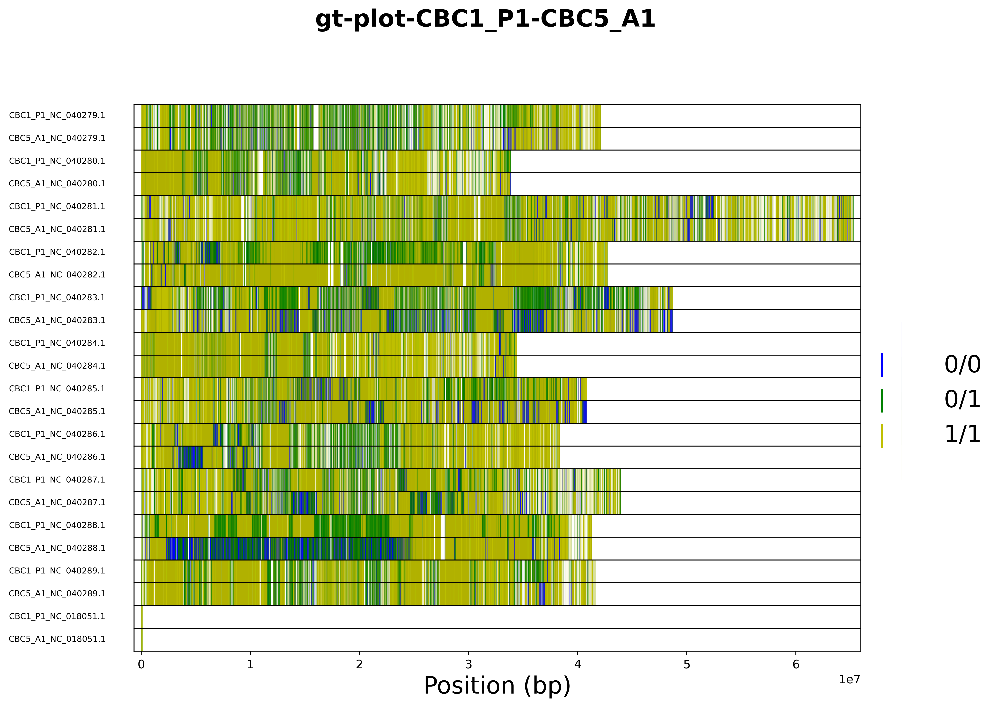

In [9]:
plt.close('all')
GTplot(samples, vcf_df, chrom_len)

#### Histograms - `DP`, `QUAL`, `TYPE` and `GT` Attributes - All Chromosomes - Unfiltered

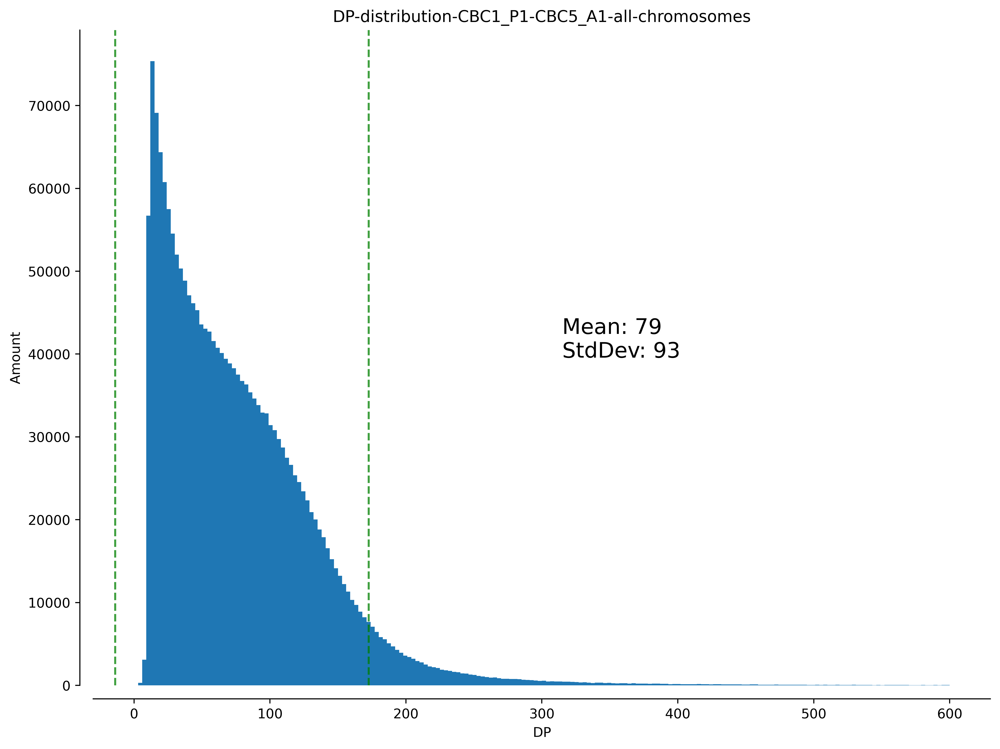

In [10]:
plot_variant_hist(samples, vcf_df, 'all', 'DP', bins=200, MSTD=True, xmax=600)

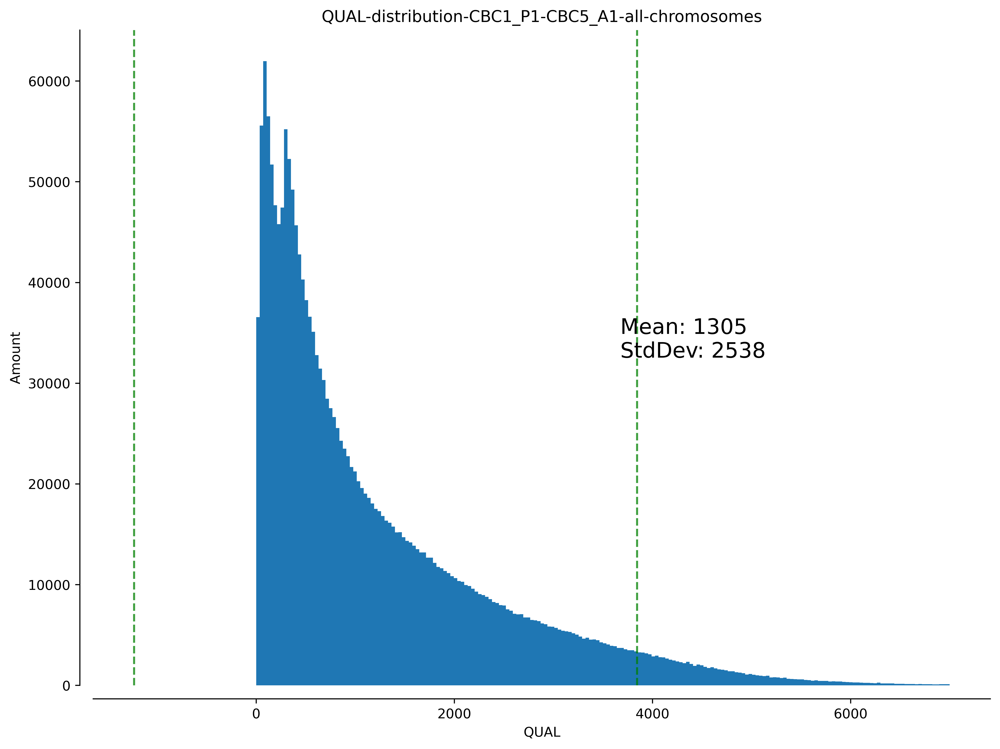

In [11]:
plot_variant_hist(samples, vcf_df, 'all', 'QUAL', bins=200,  MSTD=True, xmax=7000)

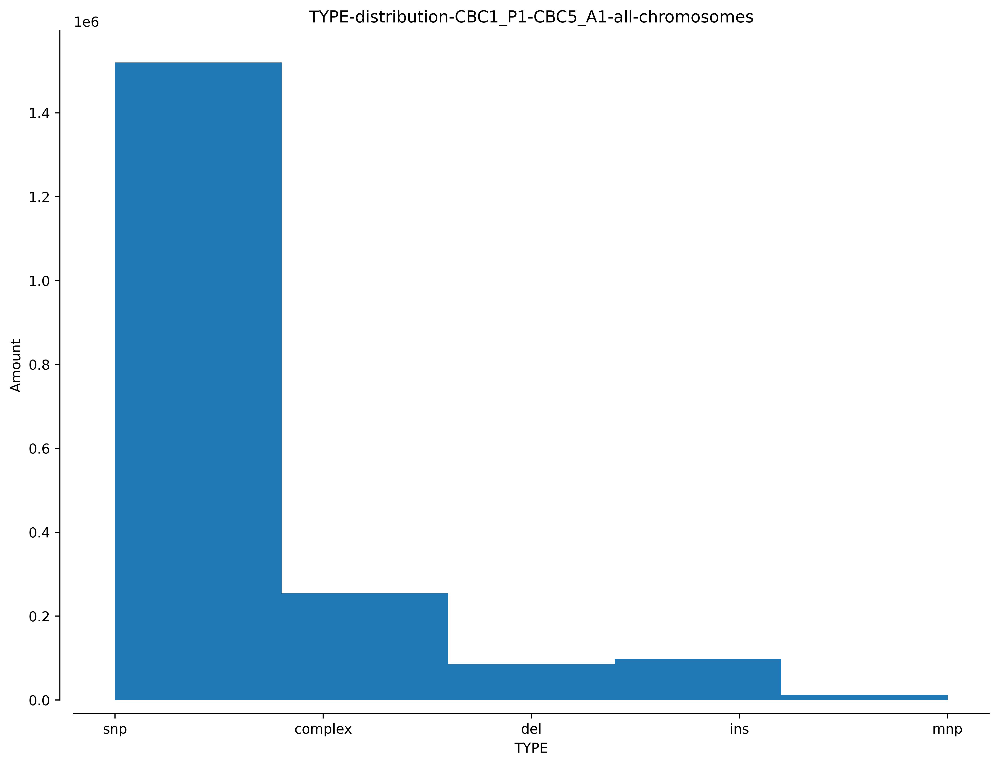

In [12]:
plot_variant_hist(samples, vcf_df, 'all', 'TYPE', bins=5)

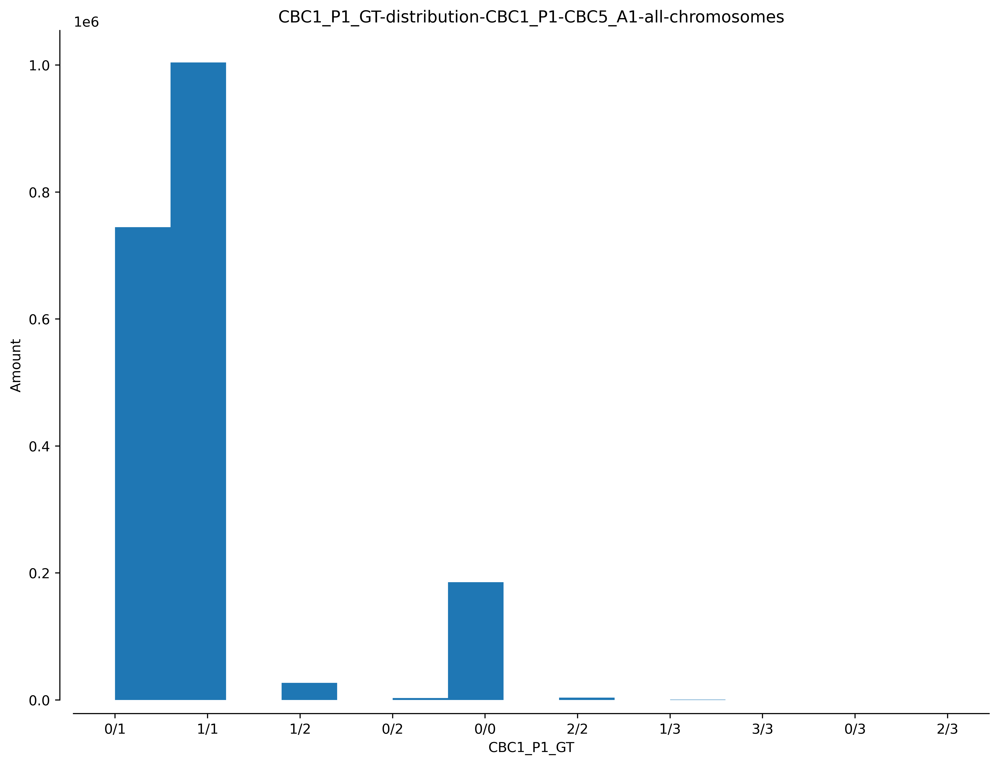

In [15]:
plot_variant_hist(samples, vcf_df, 'all', 'CBC1_P1_GT', bins=15)

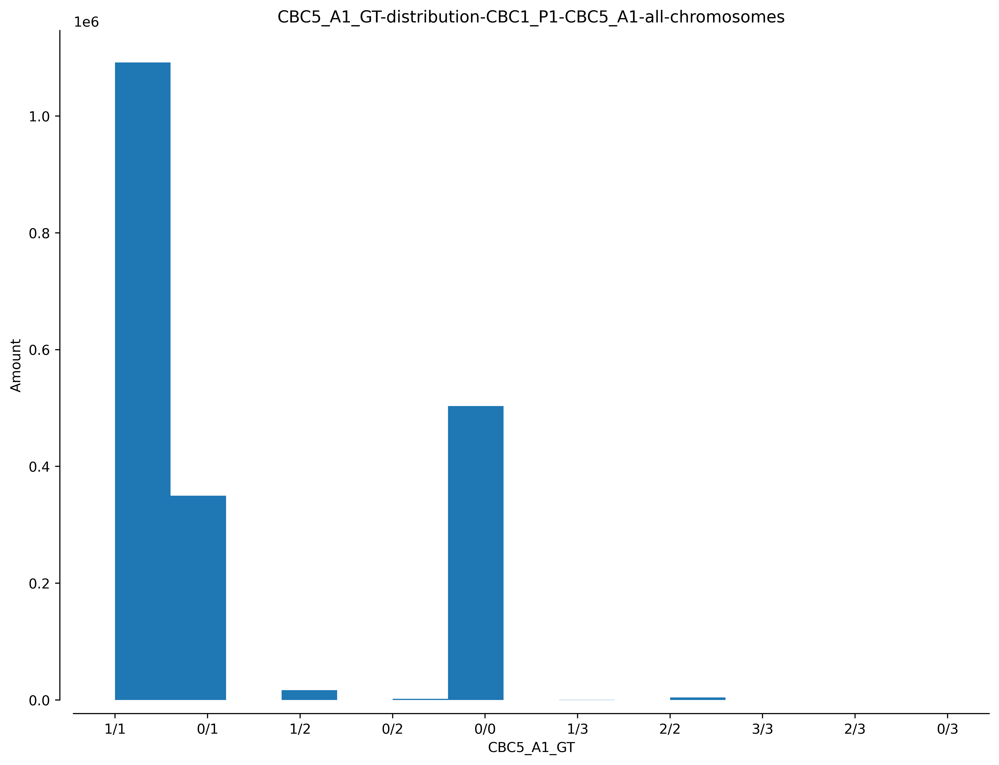

In [16]:
plot_variant_hist(samples, vcf_df, 'all', 'CBC5_A1_GT', bins=15)

#### Stacked Bar Plots - RAW

In [17]:
ct_guide()

Mutant              
                    0/0 0/1 1/1 other
Progenitor 0/0        a   b   c      
           0/1        d   e   f      
           1/1        g   h   i      
           other                    j

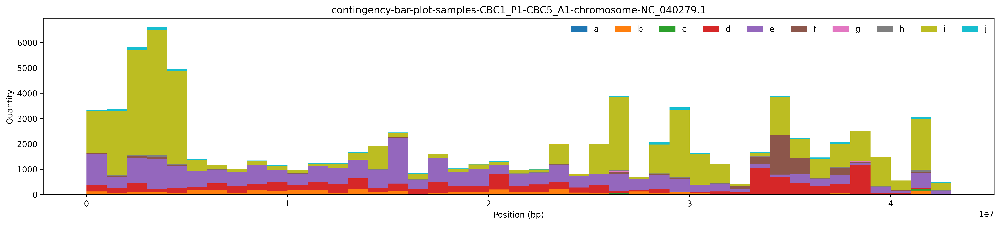

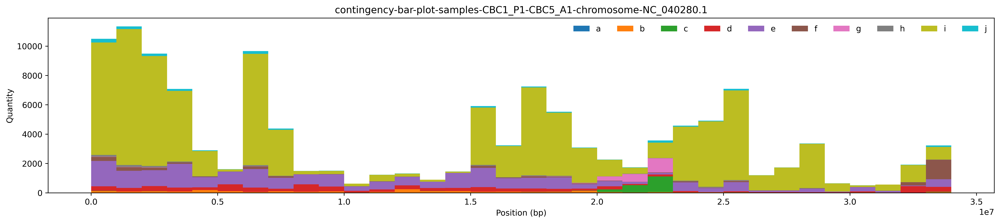

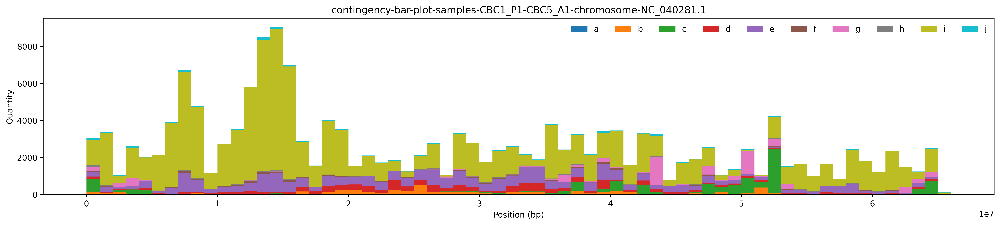

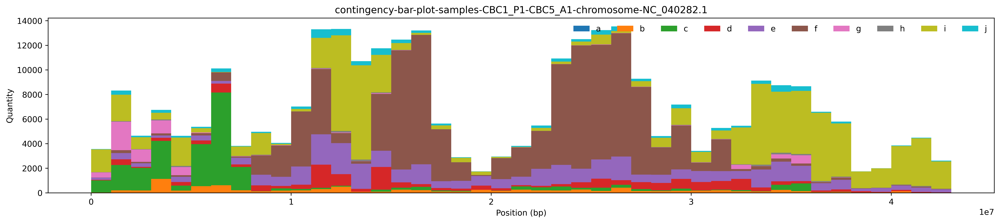

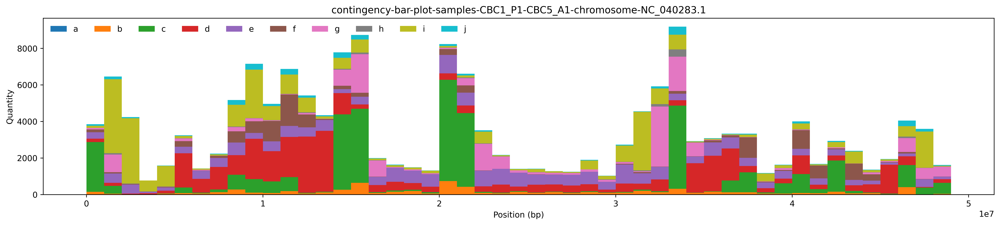

...

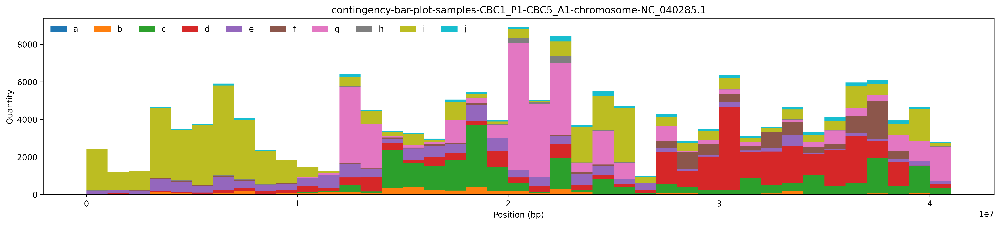

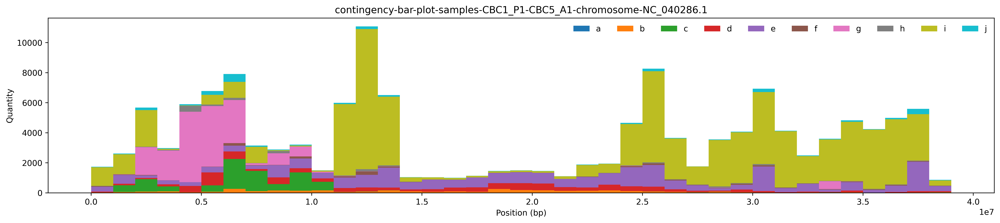

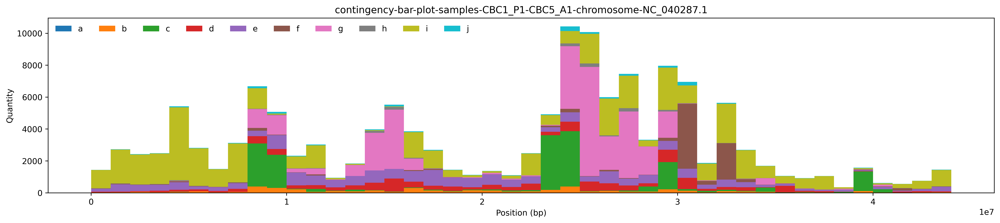

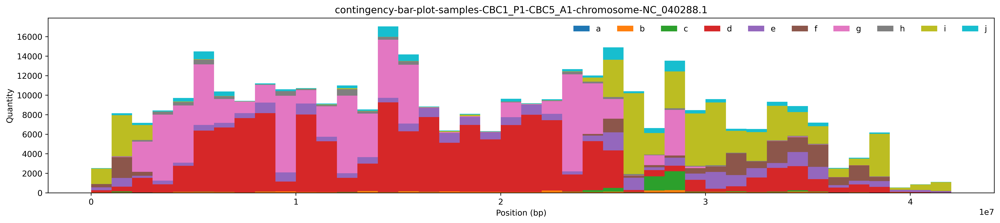

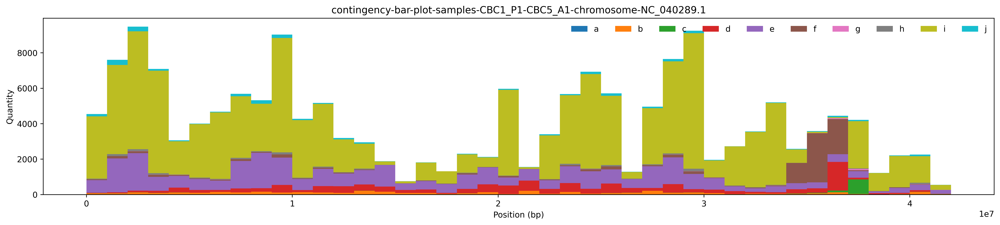

In [18]:
plt.close('all')
window_size = 1000000
CTbarPlots(samples, vcf_df, chrom_len, window_size)

## <span style="color:blue"> PART 1: Filter Out Mitochondria and Chloroplast Chromosomes </span>

#### Drop Mitochrondria and Chloroplast Chromosomes from `vcf_df` and `chrom_len`

In [19]:
drop_mito_chloro = "CHROM != NC_018051.1"
vcf_df_00 = filter_vcf(vcf_df, drop_mito_chloro)
vcf_df_00

,CHROM,POS,REF,ALT,QUAL,DP,CBC1_P1_DP,CBC5_A1_DP,CBC1_P1_GT,CBC5_A1_GT,CBC1_P1_AD,CBC5_A1_AD,AN,TYPE
0,NC_040279.1,912,G,T,571.966003,121,42,79,0/1,0/1,28/14,53/26,4,snp
1,NC_040279.1,948,AGGGGAAAC,AGGGAAAC,630.939026,104,39,65,0/1,0/1,26/13,41/24,4,del
2,NC_040279.1,1173,C,T,321.862000,57,34,23,0/1,0/1,22/12,16/7,4,snp
3,NC_040279.1,1390,C,T,214.576996,46,25,21,0/1,0/1,18/7,13/8,4,snp
4,NC_040279.1,1424,T,C,420.058014,71,35,36,0/1,0/1,23/12,22/14,4,snp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1968602,NC_040289.1,41659114,T,C,52.265900,30,17,13,0/1,0/1,11/6,11/2,4,snp
1968603,NC_040289.1,41659137,G,C,35.938702,41,24,17,0/1,0/1,18/6,15/2,4,snp
1968604,NC_040289.1,41667130,GTTTCA,GTTCA,340.695007,15,10,5,1/1,1/1,0/8,0/4,4,del
1968605,NC_040289.1,41667148,T,C,158.554993,14,10,4,0/1,0/1,5/5,1/3,4,snp


In [20]:
mito_chloro = ['NC_018051.1']
chrom_len_00 = chrom_len.drop(mito_chloro)
chrom_len_00

,LEN
CHROM,
NC_040279.1,42129361
NC_040280.1,33908088
NC_040281.1,65292630
NC_040282.1,42731077
NC_040283.1,48746289
NC_040284.1,34463471
NC_040285.1,40876636
NC_040286.1,38363498
NC_040287.1,43933251


#### Create Mitochrondria and Chloroplast Variants and Chomosome Length Dataframes

In [21]:
drop_chrom = "CHROM!=NC_040279.1, CHROM!=NC_040280.1, CHROM!=NC_040281.1, CHROM!=NC_040282.1, CHROM!=NC_040283.1, CHROM!=NC_040284.1, CHROM!=NC_040285.1, CHROM!=NC_040286.1, CHROM!=NC_040287.1, CHROM!=NC_040288.1, CHROM!=NC_040289.1"
vcf_df_mito_chloro = filter_vcf(vcf_df, drop_chrom)
vcf_df_mito_chloro

,CHROM,POS,REF,ALT,QUAL,DP,CBC1_P1_DP,CBC5_A1_DP,CBC1_P1_GT,CBC5_A1_GT,CBC1_P1_AD,CBC5_A1_AD,AN,TYPE
0,NC_018051.1,11786,T,C,492.441010,22,9,13,0/1,1/1,1/8,0/13,4,snp
1,NC_018051.1,11801,TCTTCCT,CCTACCC,319.031006,26,10,16,0/1,0/1,4/6,3/13,4,complex
2,NC_018051.1,11813,AGCC,GGCT,305.860992,28,10,18,0/1,0/1,2/6,4/13,4,complex
3,NC_018051.1,11825,GGTAGGTAAT,AGTGGGGAAC,315.924988,28,9,19,0/1,0/1,1/6,6/13,4,complex
4,NC_018051.1,18327,G,A,580.976990,25,15,10,1/1,0/1,0/15,2/8,4,snp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,NC_018051.1,129428,T,C,245.087997,20,10,10,0/1,0/1,2/7,2/7,4,snp
81,NC_018051.1,132082,C,G,586.130981,33,16,17,0/1,1/1,2/14,1/16,4,snp
82,NC_018051.1,132156,C,T,45.394600,19,10,9,0/1,0/1,6/4,7/2,4,snp
83,NC_018051.1,132169,CCGGT,ACGGG,478.346985,19,9,10,1/1,1/1,0/9,0/10,4,complex


In [22]:
mito_chloro_len = chrom_len.loc[mito_chloro]
mito_chloro_len

,LEN
CHROM,
NC_018051.1,152415


#### Contingency Table - No Mitochondria/Chloroplast

In [23]:
contingency_table_1 = contingency_table(samples, vcf_df_00, 'all')


Contingency Table - Chromosome all

                 CBC5_A1_GT                       
                        0/0     0/1     1/1  other
CBC1_P1_GT 0/0            0   52496  132507  45041
           0/1       287090  273450  178971  45041
           1/1       211458   19719  767875  45041
           other      45041   45041   45041  45041


#### GT Plot - No Mitochondria/Chloroplast

In [24]:
# plt.close('all')
# GTplot(samples, vcf_df_00, chrom_len_00)

#### Histograms - `DP`, `QUAL`, `TYPE` and `GT` Attributes - No Mitochondria/Chloroplast

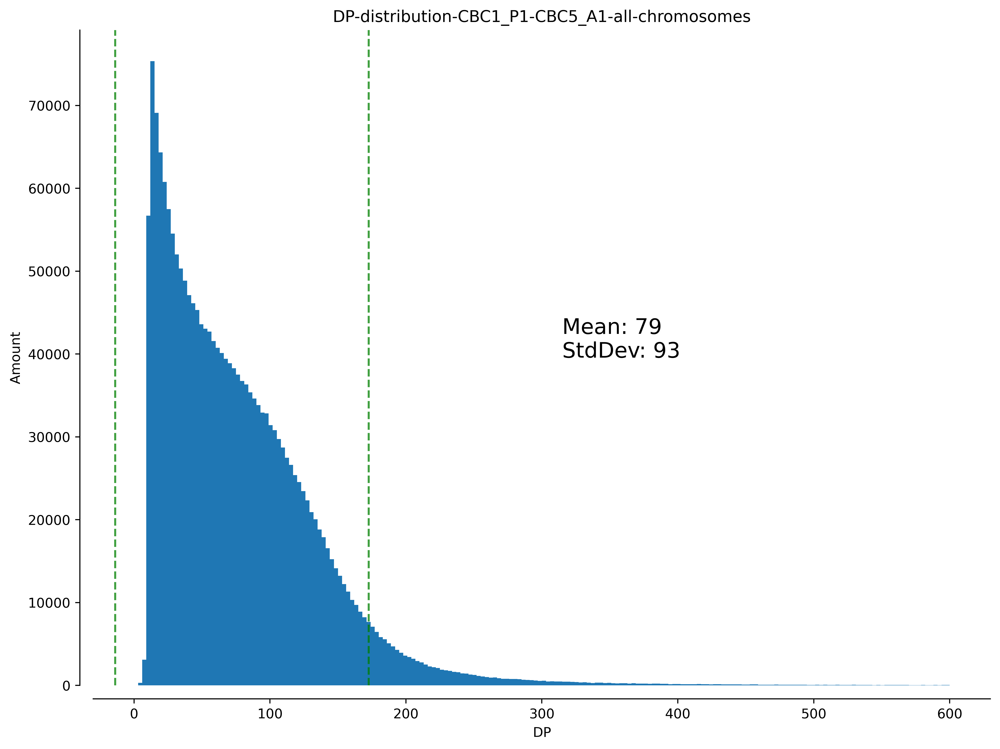

In [25]:
plot_variant_hist(samples, vcf_df_00, 'all', 'DP', bins=200, MSTD=True, xmax=600)

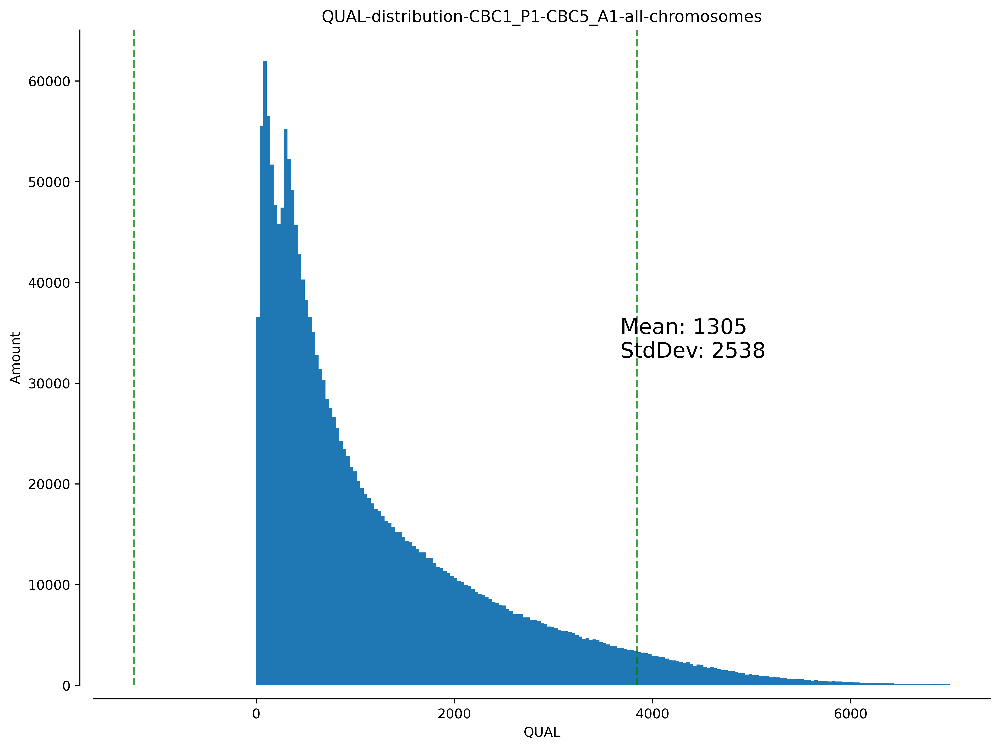

In [26]:
plot_variant_hist(samples, vcf_df_00, 'all', 'QUAL', bins=200,  MSTD=True, xmax=7000)

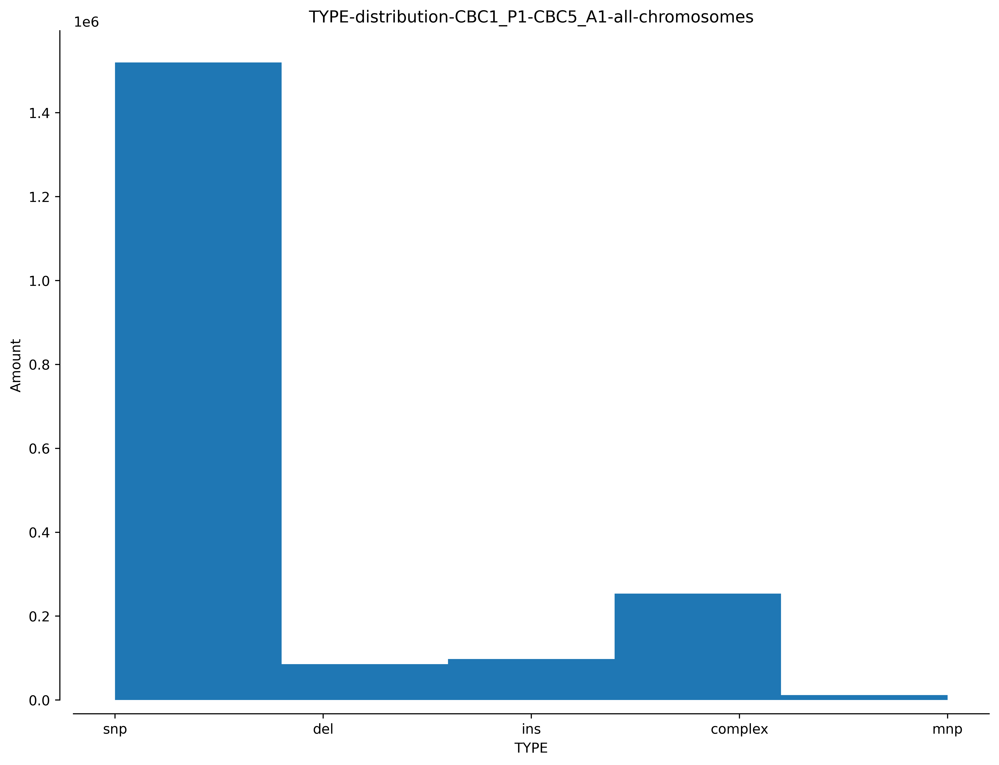

In [27]:
plot_variant_hist(samples, vcf_df_00, 'all', 'TYPE', bins=5)

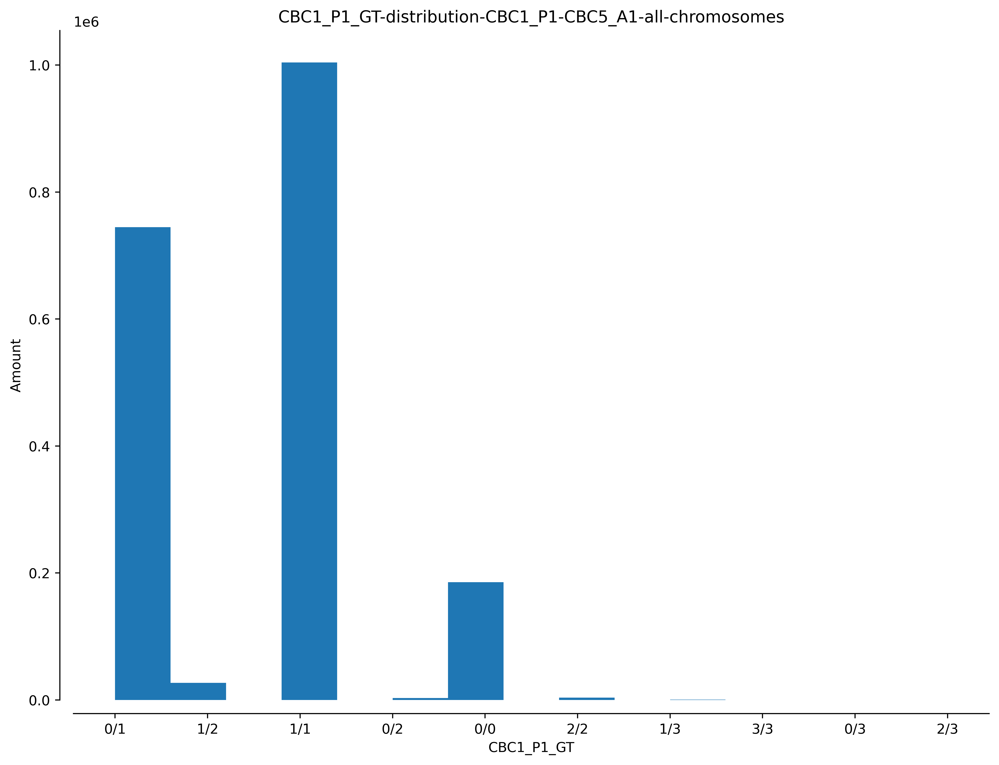

In [29]:
plot_variant_hist(samples, vcf_df_00, 'all', '%s_GT' % progenitor, bins=15)

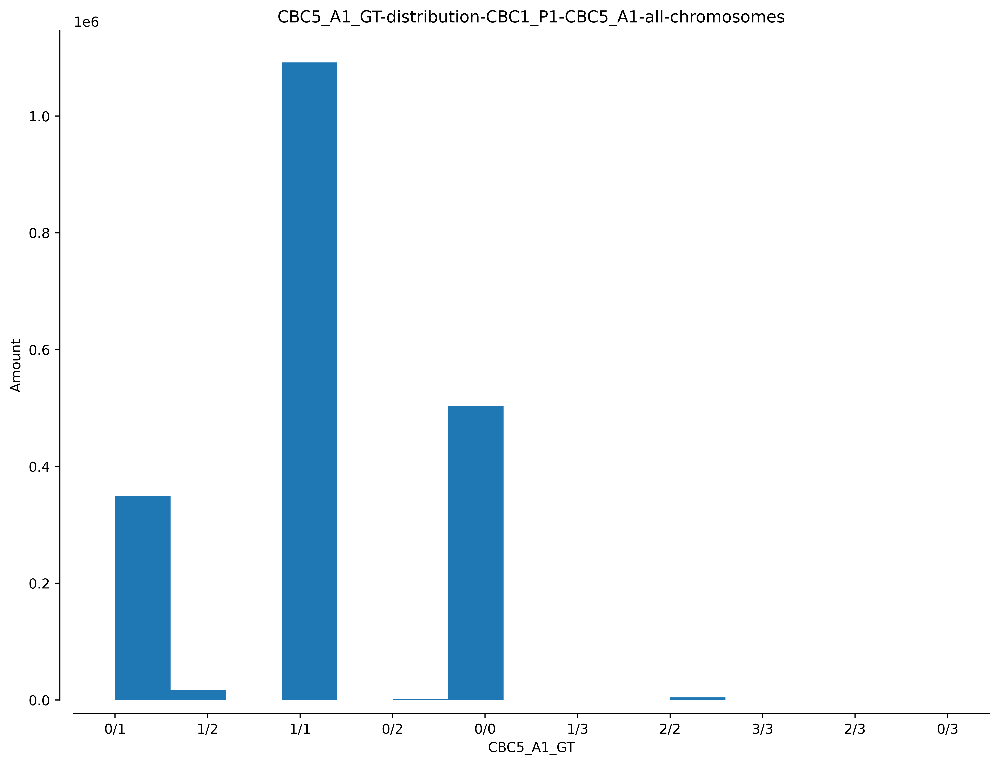

In [30]:
plot_variant_hist(samples, vcf_df_00, 'all', '%s_GT' % mutant, bins=15)

## <span style="color:blue">PART 2: Cutting Off by Mean±2StdDev Histograms of `DP` Attribute</span>

In [31]:
cutoff_left = vcf_df_00.DP.mean() - (2 * vcf_df_00.DP.std())
cutoff_right = vcf_df_00.DP.mean() + (2 * vcf_df_00.DP.std())

filter_dp = "DP >= %i, DP <= %i" % (cutoff_left, cutoff_right)
print(filter_dp)

vcf_df_01 = filter_vcf(vcf_df_00, filter_dp)
vcf_df_01

DP >= -107, DP <= 265


,CHROM,POS,REF,ALT,QUAL,DP,CBC1_P1_DP,CBC5_A1_DP,CBC1_P1_GT,CBC5_A1_GT,CBC1_P1_AD,CBC5_A1_AD,AN,TYPE
0,NC_040279.1,912,G,T,571.966003,121,42,79,0/1,0/1,28/14,53/26,4,snp
1,NC_040279.1,948,AGGGGAAAC,AGGGAAAC,630.939026,104,39,65,0/1,0/1,26/13,41/24,4,del
2,NC_040279.1,1173,C,T,321.862000,57,34,23,0/1,0/1,22/12,16/7,4,snp
3,NC_040279.1,1390,C,T,214.576996,46,25,21,0/1,0/1,18/7,13/8,4,snp
4,NC_040279.1,1424,T,C,420.058014,71,35,36,0/1,0/1,23/12,22/14,4,snp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1942510,NC_040289.1,41659114,T,C,52.265900,30,17,13,0/1,0/1,11/6,11/2,4,snp
1942511,NC_040289.1,41659137,G,C,35.938702,41,24,17,0/1,0/1,18/6,15/2,4,snp
1942512,NC_040289.1,41667130,GTTTCA,GTTCA,340.695007,15,10,5,1/1,1/1,0/8,0/4,4,del
1942513,NC_040289.1,41667148,T,C,158.554993,14,10,4,0/1,0/1,5/5,1/3,4,snp


#### Verify DP Histogram Cutoff Off by Mean±StdDev

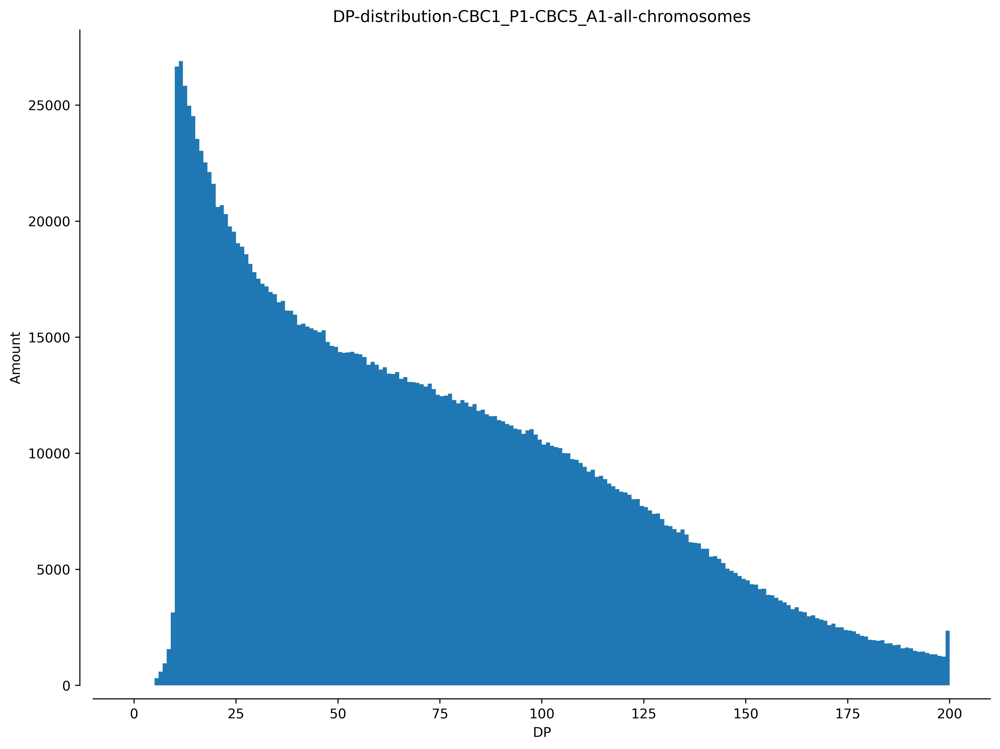

In [32]:
plot_variant_hist(samples, vcf_df_01, 'all', 'DP', bins=200, xmax=200)

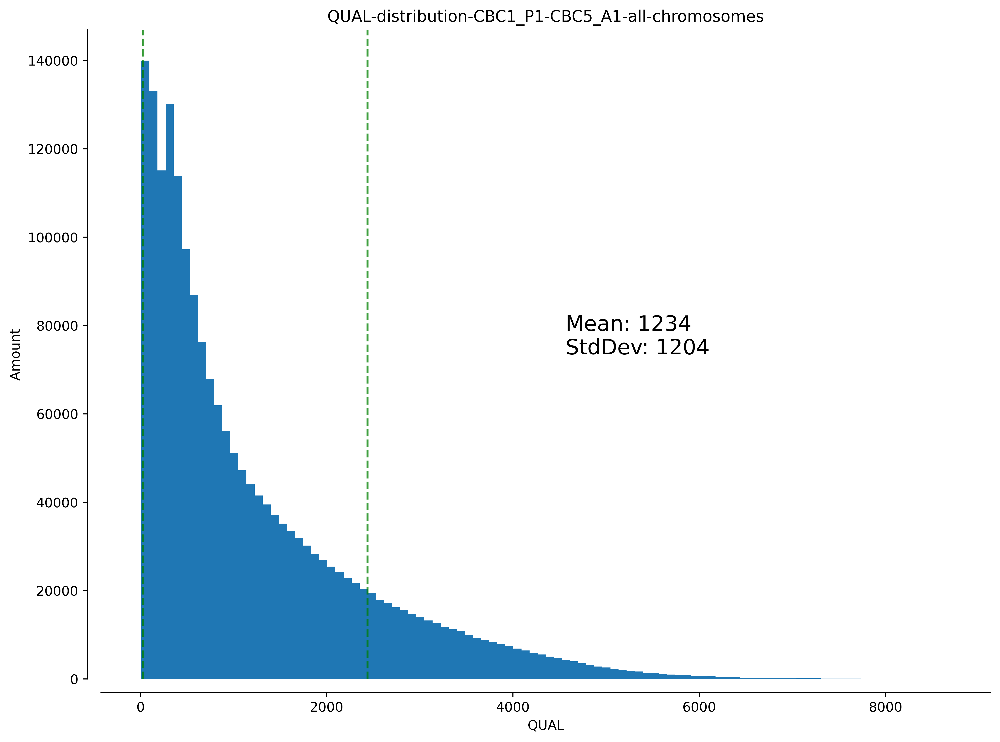

In [33]:
plot_variant_hist(samples, vcf_df_01, 'all', 'QUAL', bins=100, MSTD=True)

#### Contingency Table After DP Cutoff by Mean±StdDev

In [34]:
contingency_table_2 = contingency_table(samples, vcf_df_01, 'all')


Contingency Table - Chromosome all

                 CBC5_A1_GT                       
                        0/0     0/1     1/1  other
CBC1_P1_GT 0/0            0   51039  132478  43507
           0/1       284832  255445  178544  43507
           1/1       211386   19531  765753  43507
           other      43507   43507   43507  43507


#### GT Plot After DP Cutoff by Mean±StdDev

In [35]:
# plt.close('all')
# GTplot(samples, vcf_df_01, chrom_len_00)

#### Histogram 'GT' Attribute after DP Cutoff

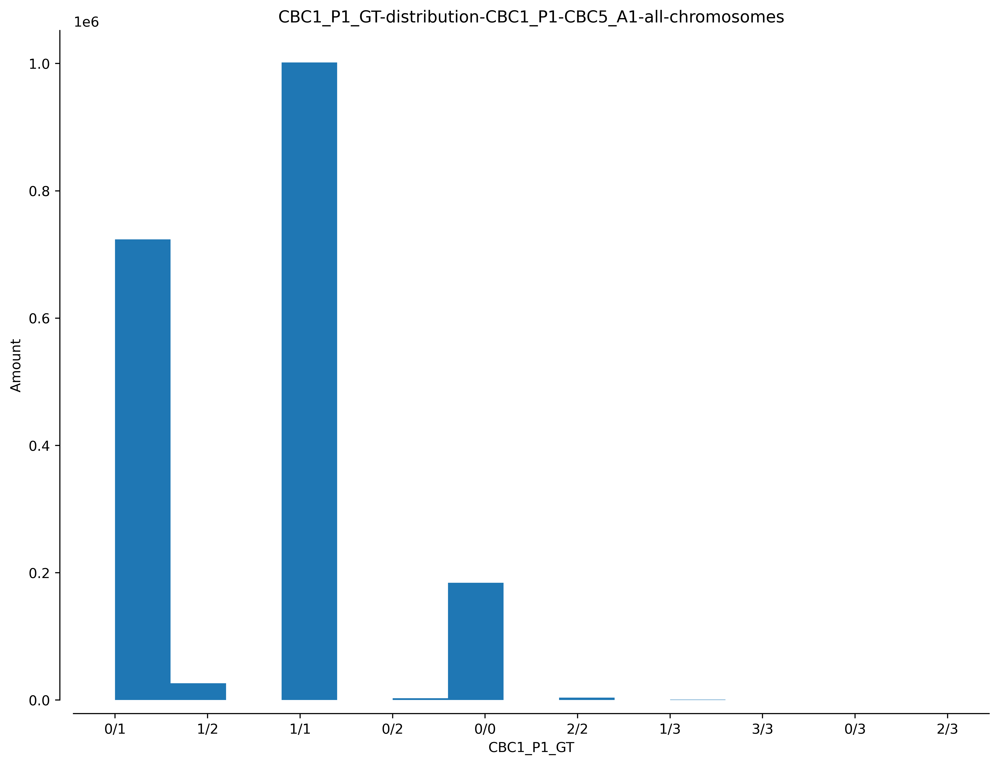

In [36]:
plot_variant_hist(samples, vcf_df_01, 'all', '%s_GT' % progenitor, bins=15)

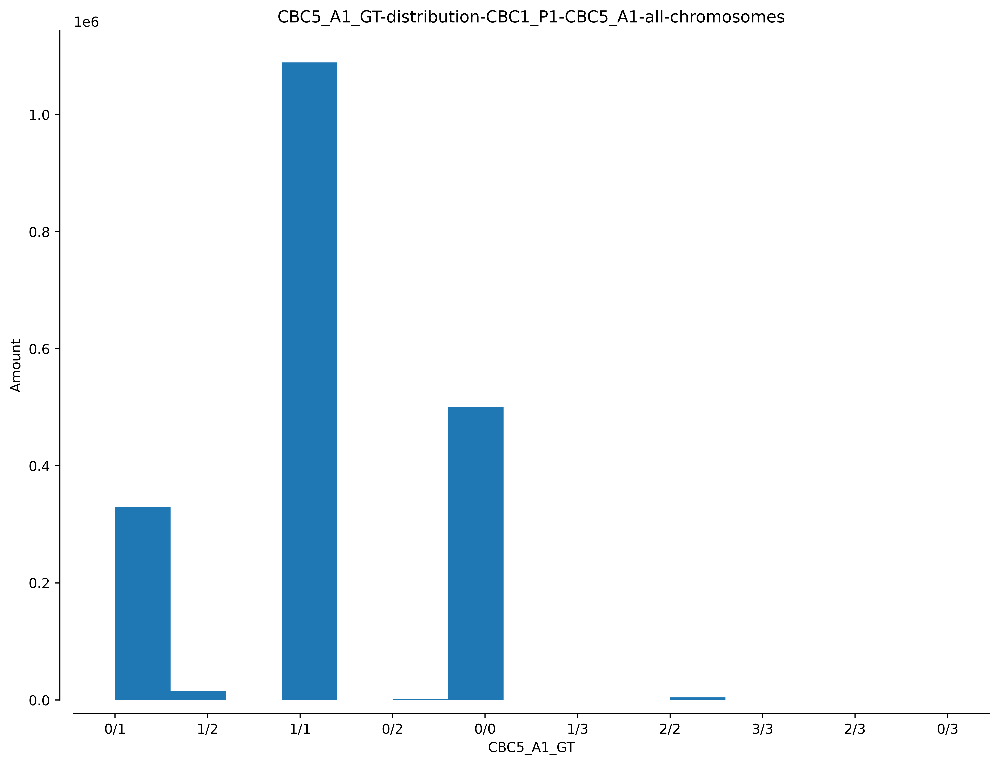

In [37]:
plot_variant_hist(samples, vcf_df_01, 'all', '%s_GT' % mutant, bins=15)

## <span style="color:blue">PART 3: Extract `complex` from `TYPE` Attribute</span>

#### Extract `complex`  `TYPE` Attribute

In [38]:
extract_type = "TYPE != snp, TYPE != mnp, TYPE != ins, TYPE != del"
vcf_df_02 = filter_vcf(vcf_df_01, extract_type)
vcf_df_02

,CHROM,POS,REF,ALT,QUAL,DP,CBC1_P1_DP,CBC5_A1_DP,CBC1_P1_GT,CBC5_A1_GT,CBC1_P1_AD,CBC5_A1_AD,AN,TYPE
0,NC_040279.1,1720,GTTTTTTTTTTTTTTTTTTTTTTTATTTCATGGTTCTGTC,GTTTTTTTTTTTTATTTTTTTTTATTTCATGGTTCTGTC,499.584991,56,26,30,1/2,1/2,0/8,1/8,4,complex
1,NC_040279.1,6532,TAAAAAAAAATTAATAAAAAAATTTTAAAAATCGAGGAACTGACAC...,TAAAAAAAAAATAATAAAAAAAA,144.738007,5,3,2,1/1,1/1,0/3,0/2,4,complex
2,NC_040279.1,8298,AAATGGGCCAAACGAGCCCGAAGACTCGA,AAACGGGCCAAACGAGCCCGAAGACCCGA,3229.810059,217,108,109,1/2,1/2,14/30,21/31,4,complex
3,NC_040279.1,8523,CAAGCAGACCCGAAA,CAGGCAGACCTGAAA,3128.570068,257,138,119,0/2,1/2,28/28,19/28,4,complex
4,NC_040279.1,8871,GGCCT,AGCCC,1036.459961,143,75,68,0/1,0/1,32/24,29/20,4,complex
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250809,NC_040289.1,41488977,GTCA,TTCG,1197.560059,115,52,63,0/1,1/2,21/20,17/23,4,complex
250810,NC_040289.1,41489075,AG,CA,806.528015,87,42,45,0/2,0/1,13/11,15/16,4,complex
250811,NC_040289.1,41489422,AAAAAAAAGGTAAAACAAACTGTGGCTTCCCTGACATGT,AAAAAAAAA,608.395996,69,34,35,0/1,0/1,21/13,18/17,4,complex
250812,NC_040289.1,41489837,TTAATTTTTTTTTTCTCAG,ATATTTTTTTTTTCTCAG,1921.920044,159,73,86,0/1,1/2,25/28,18/32,4,complex


#### Examples of `complex` mutation type

In [39]:
vcf_df_02[ ['REF', 'ALT'] ].head()

,REF,ALT
0,GTTTTTTTTTTTTTTTTTTTTTTTATTTCATGGTTCTGTC,GTTTTTTTTTTTTATTTTTTTTTATTTCATGGTTCTGTC
1,TAAAAAAAAATTAATAAAAAAATTTTAAAAATCGAGGAACTGACAC...,TAAAAAAAAAATAATAAAAAAAA
2,AAATGGGCCAAACGAGCCCGAAGACTCGA,AAACGGGCCAAACGAGCCCGAAGACCCGA
3,CAAGCAGACCCGAAA,CAGGCAGACCTGAAA
4,GGCCT,AGCCC


In [40]:
vcf_df_02[ ['REF', 'ALT'] ].tail()

,REF,ALT
250809,GTCA,TTCG
250810,AG,CA
250811,AAAAAAAAGGTAAAACAAACTGTGGCTTCCCTGACATGT,AAAAAAAAA
250812,TTAATTTTTTTTTTCTCAG,ATATTTTTTTTTTCTCAG
250813,CCGC,TCAT


#### TYPE `complex` Histogram Verification

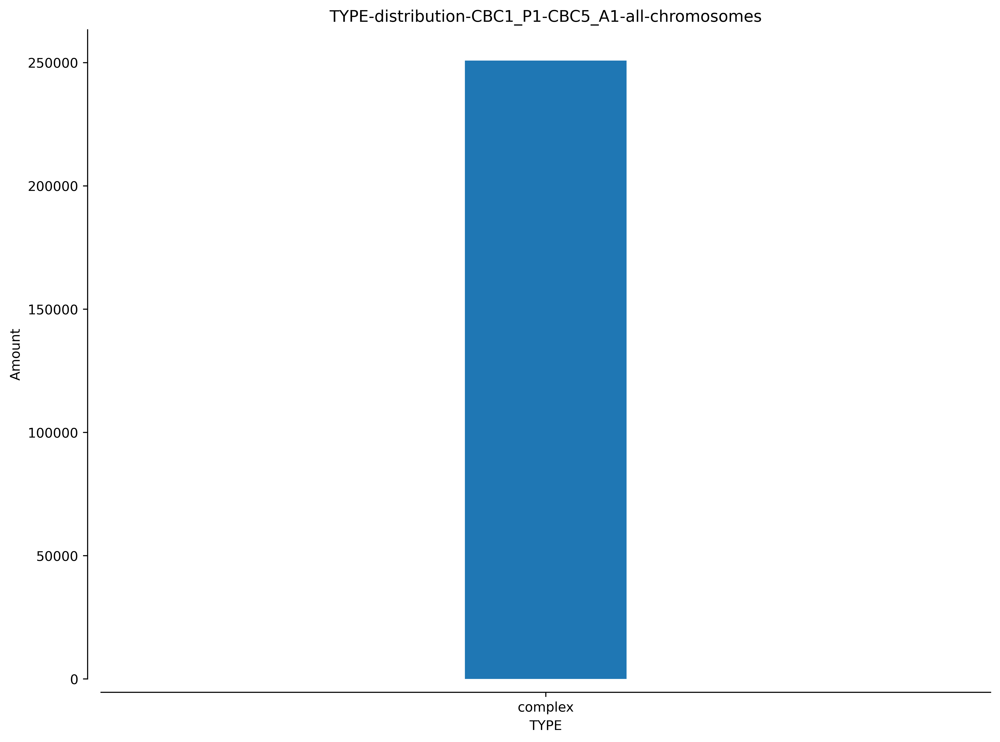

In [41]:
plot_variant_hist(samples, vcf_df_02, 'all', 'TYPE', bins=5)

#### Contingency Table - `complex` TYPE only

In [42]:
contingency_table_3 = contingency_table(samples, vcf_df_02, 'all')


Contingency Table - Chromosome all

                 CBC5_A1_GT                     
                        0/0    0/1    1/1  other
CBC1_P1_GT 0/0            0   8142  13940  26231
           0/1        35574  38434  19985  26231
           1/1        23907   2145  82456  26231
           other      26231  26231  26231  26231


#### GT Plot - `complex` TYPE only

In [43]:
# plt.close('all')
# GTplot(samples, vcf_df_02, chrom_len_00)

#### Histograms - DP, QUAL, and GT Attributes after TYPE Filtering

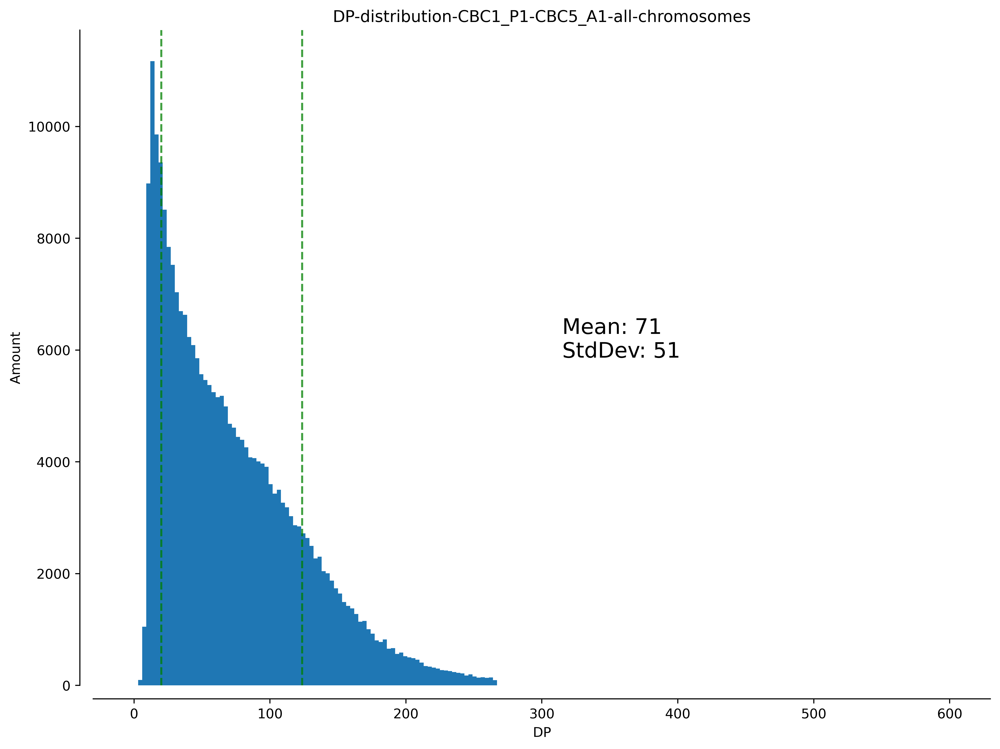

In [44]:
plot_variant_hist(samples, vcf_df_02, 'all', 'DP', bins=200, MSTD=True, xmax=600)

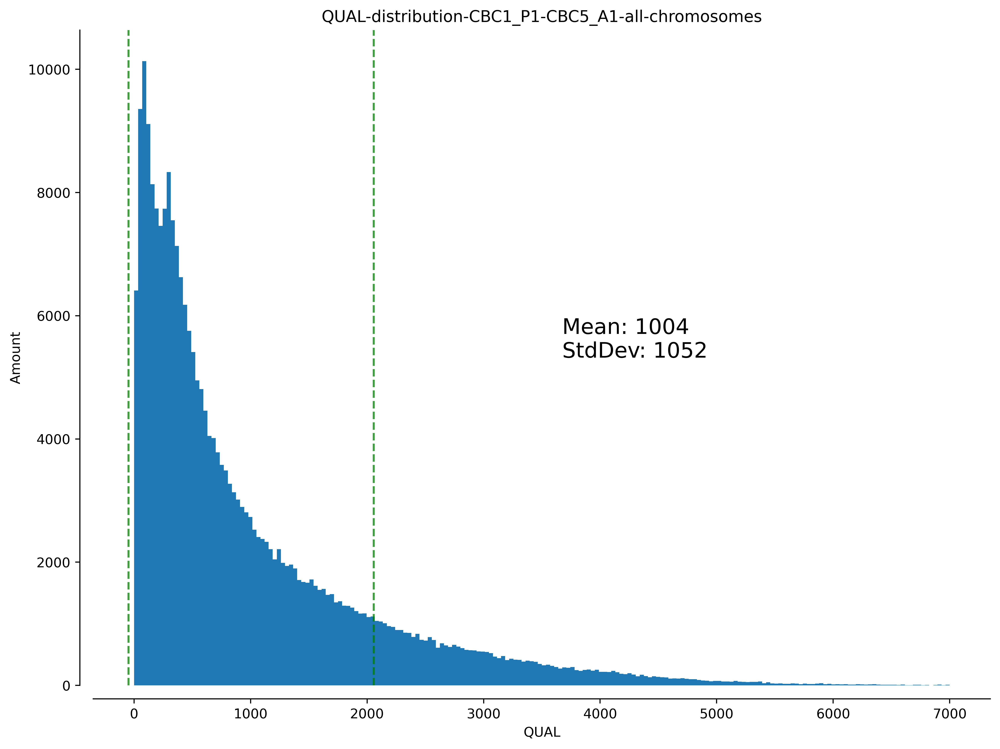

In [45]:
plot_variant_hist(samples, vcf_df_02, 'all', 'QUAL', bins=200,  MSTD=True, xmax=7000)

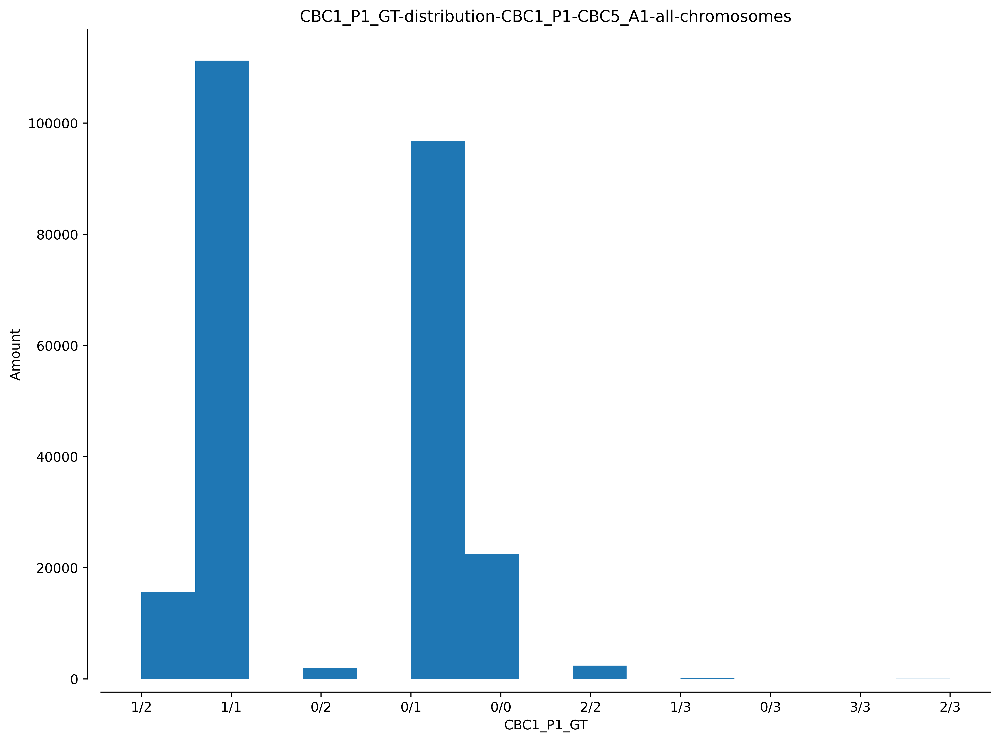

In [46]:
plot_variant_hist(samples, vcf_df_02, 'all', '%s_GT' % progenitor, bins=15)

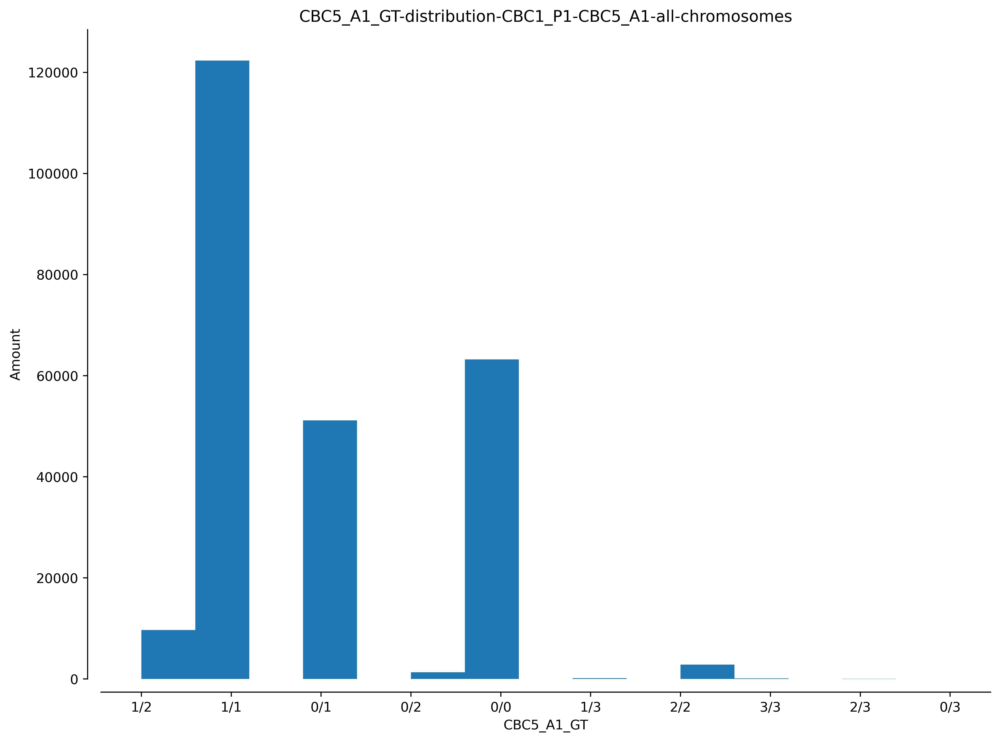

In [47]:
plot_variant_hist(samples, vcf_df_02, 'all', '%s_GT' % mutant, bins=15)

## <span style="color:blue"> PART 4: Cutting Off by Mean±StdDev Histograms of `QUAL` Attribute</span>

In [48]:
# cutoff_left = vcf_df_02.QUAL.mean() - vcf_df_02.QUAL.std()
# cutoff_right = vcf_df_02.QUAL.mean() + vcf_df_02.QUAL.std()

# filter_qual = "QUAL >= %i, QUAL <= %i" % (cutoff_left, cutoff_right)
# print(filter_qual)

# vcf_df_03 = filter_vcf(vcf_df_02, filter_qual)
# vcf_df_03

#### Verify `DP` and `QUAL` Histograms after `QUAL` Cutoff Off by Mean±StdDev

In [49]:
# plot_variant_hist(samples, vcf_df_03, 'all', 'DP', bins=200, xmax=200)

In [50]:
# plot_variant_hist(samples, vcf_df_03, 'all', 'QUAL', bins=100, xmax=3500)

#### Contingency Table After QUAL Cutoff by Mean±StdDev

In [51]:
# contingency_table_4 = contingency_table(samples, vcf_df_03, 'all')
# contingency_table_4

#### GT Plot After QUAL Cutoff by Mean±StdDev

In [52]:
# plt.close('all')
# GTplot(samples, vcf_df_03, chrom_len_00)

#### Histograms after QUAL Cutoff by Mean±StdDev

In [53]:
# plot_variant_hist(samples, vcf_df_03, 'all', 'CBC1_P1_GT', bins=9)

In [54]:
# plot_variant_hist(samples, vcf_df_03, 'all', 'CBC5_A1_GT', bins=9)

## <span style="color:blue"> PART 5: Filtering GTs 0/0, 1/1, 'Other' </span>

#### Filter out where samples GTs are the same (0/0, 1/1) and have 'Other'

In [55]:
progenitor_gts_filter = "CBC1_P1_GT != ./., CBC1_P1_GT != 0/2, CBC1_P1_GT != 1/2, CBC1_P1_GT != 2/2, CBC1_P1_GT != 0/3, CBC1_P1_GT != 1/3, CBC1_P1_GT != 2/3, CBC1_P1_GT != 3/3"
vcf_df_04 = filter_vcf(vcf_df_02, progenitor_gts_filter)

mutant_gts_filter = "CBC5_A1_GT != ./., CBC5_A1_GT != 0/2, CBC5_A1_GT != 1/2, CBC5_A1_GT != 2/2, CBC5_A1_GT != 0/3, CBC5_A1_GT != 1/3, CBC5_A1_GT != 2/3, CBC5_A1_GT != 3/3"
vcf_df_04 = filter_vcf(vcf_df_04, mutant_gts_filter)

genotypes = ['0/0', '1/1']
for genotype in genotypes:
    vcf_df_04 = filter_similar_gt(samples, vcf_df_04, genotype)

vcf_df_04

,CHROM,POS,REF,ALT,QUAL,DP,CBC1_P1_DP,CBC5_A1_DP,CBC1_P1_GT,CBC5_A1_GT,CBC1_P1_AD,CBC5_A1_AD,AN,TYPE
0,NC_040279.1,8871,GGCCT,AGCCC,1036.459961,143,75,68,0/1,0/1,32/24,29/20,4,complex
1,NC_040279.1,12210,ATC,CAA,448.933990,129,77,52,0/1,0/1,61/16,37/15,4,complex
2,NC_040279.1,12243,GAC,AAA,1368.060059,241,129,112,0/1,0/1,91/38,76/36,4,complex
3,NC_040279.1,14771,GGTT,AGTC,186.802002,41,22,19,0/1,0/1,13/9,9/6,4,complex
4,NC_040279.1,60920,GA,AG,1222.739990,54,29,25,0/1,1/1,5/24,2/23,4,complex
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142122,NC_040289.1,41487815,AAAC,CAAT,2843.939941,218,98,120,0/1,0/1,58/39,43/77,4,complex
142123,NC_040289.1,41488049,TTTT,ATTG,3329.709961,237,123,114,0/1,0/1,74/49,35/79,4,complex
142124,NC_040289.1,41488526,TTATTTT,TTGTC,1733.699951,94,53,41,0/1,0/1,18/34,9/32,4,complex
142125,NC_040289.1,41489422,AAAAAAAAGGTAAAACAAACTGTGGCTTCCCTGACATGT,AAAAAAAAA,608.395996,69,34,35,0/1,0/1,21/13,18/17,4,complex


#### Contingency Table after GT Filtering

In [56]:
contingency_table_5 = contingency_table(samples, vcf_df_04, 'all')


Contingency Table - Chromosome all

                 CBC5_A1_GT                    
                        0/0    0/1    1/1 other
CBC1_P1_GT 0/0            0   8142  13940     0
           0/1        35574  38434  19985     0
           1/1        23907   2145      0     0
           other          0      0      0     0


#### GT Plot after GT Filtering

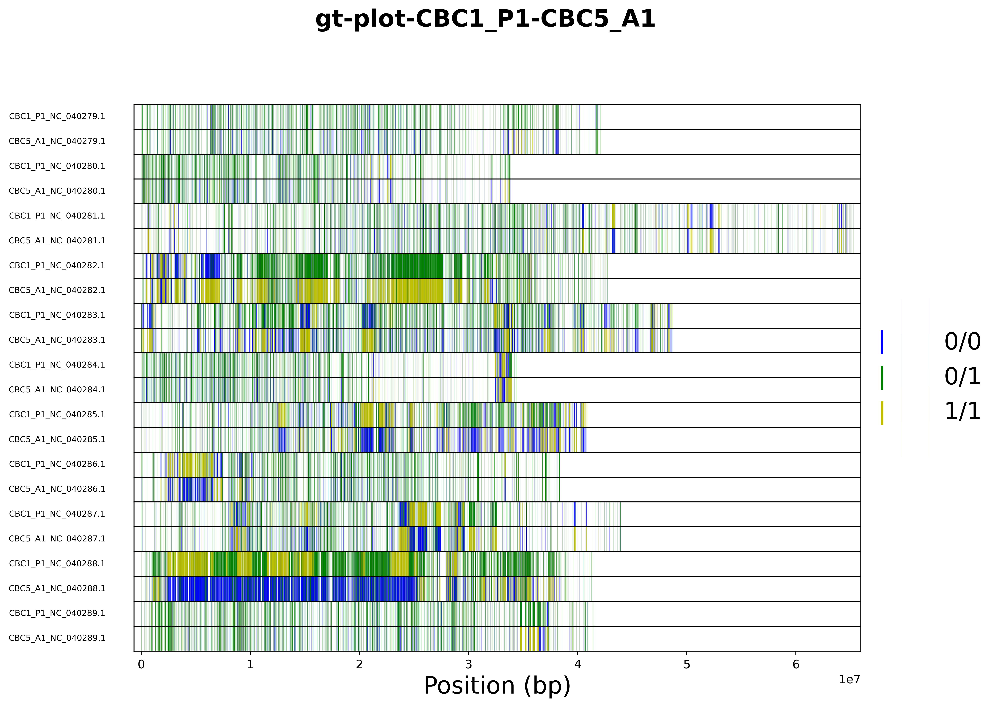

In [57]:
plt.close('all')
GTplot(samples, vcf_df_04, chrom_len_00)

#### Histograms GT after GT Filtering 

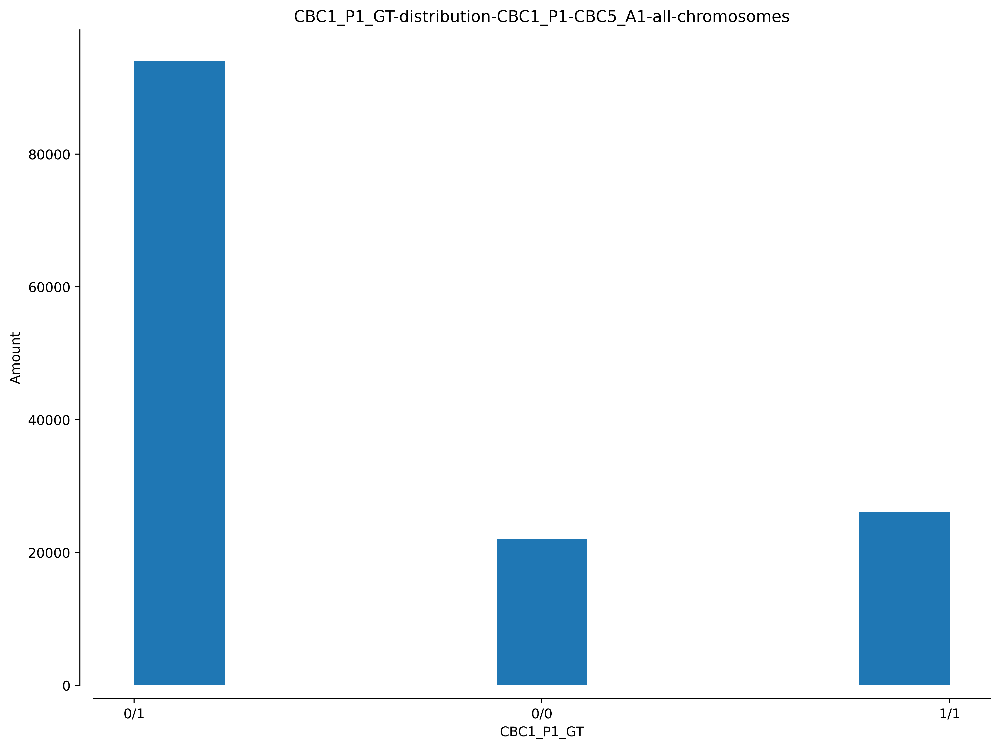

In [58]:
plot_variant_hist(samples, vcf_df_04, 'all', '%s_GT' % progenitor, bins=9)

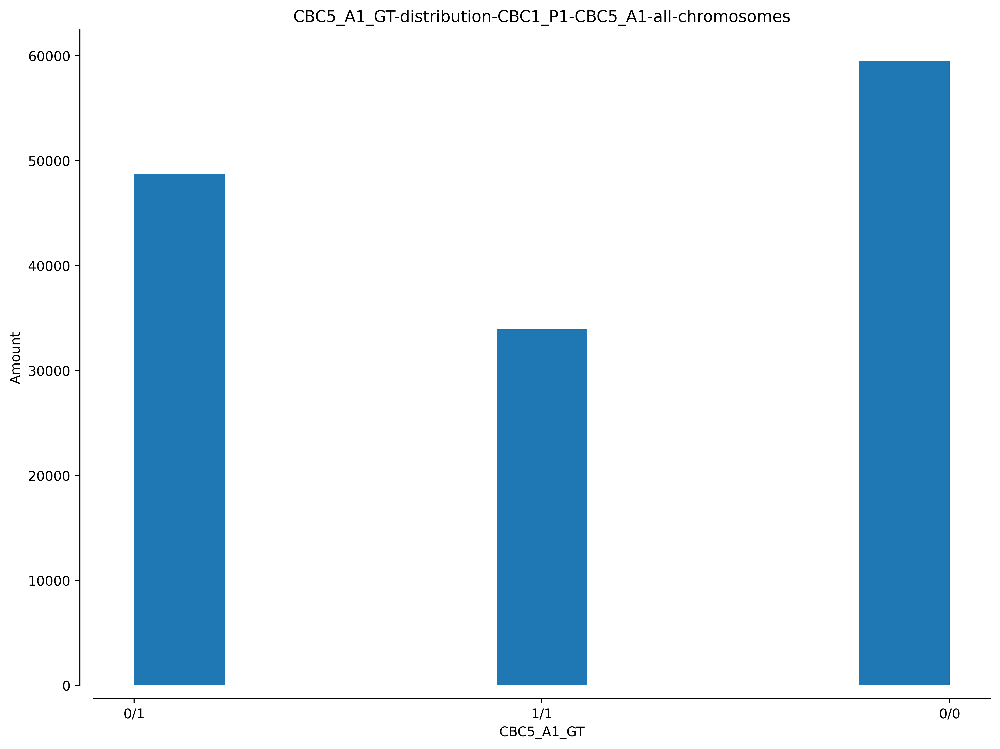

In [59]:
plot_variant_hist(samples, vcf_df_04, 'all', '%s_GT' % mutant, bins=9)

## <span style="color:blue"> PART 6: Stacked Bar Plots</span>

In [60]:
ct_guide()

Mutant              
                    0/0 0/1 1/1 other
Progenitor 0/0        a   b   c      
           0/1        d   e   f      
           1/1        g   h   i      
           other                    j

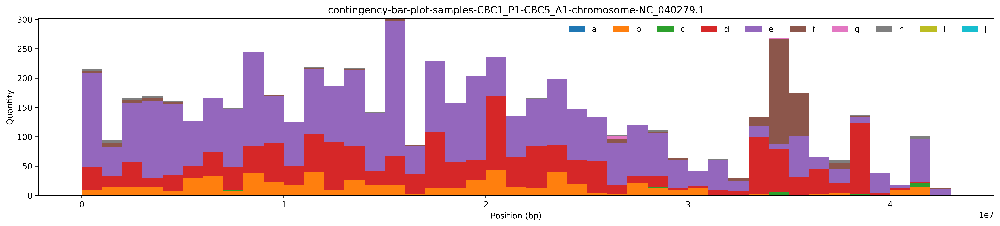

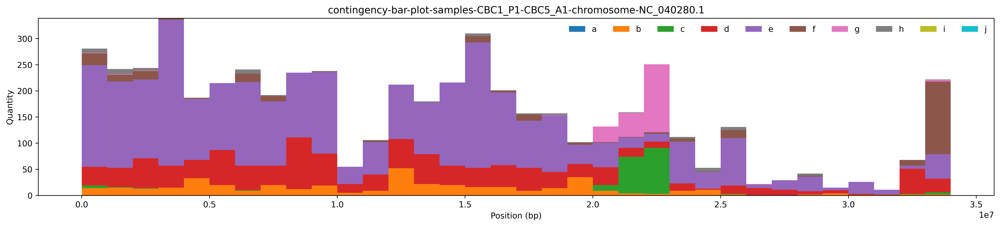

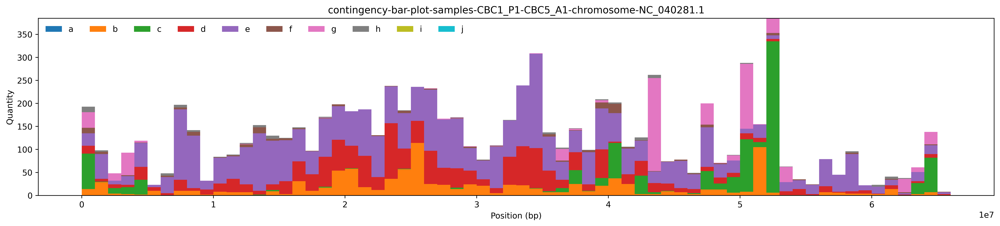

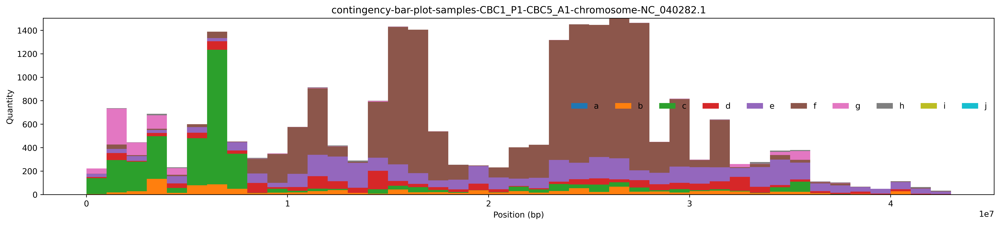

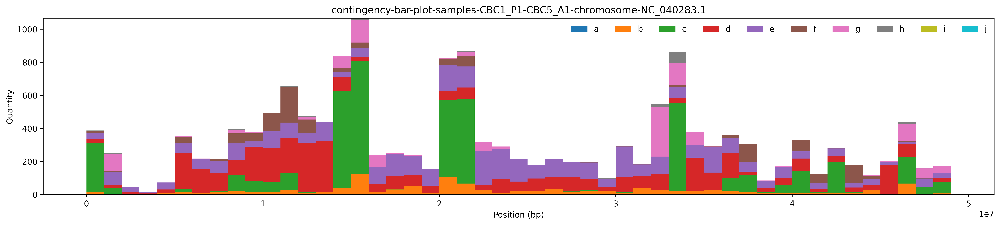

...

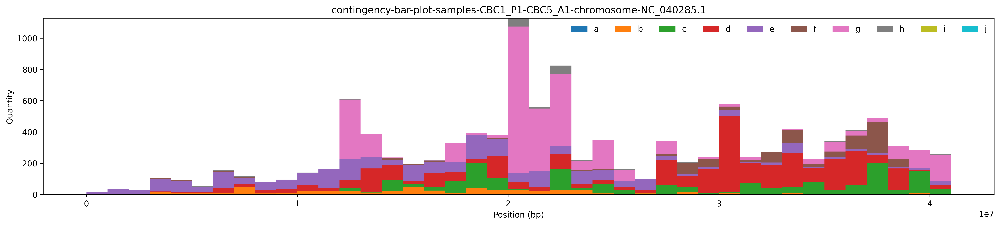

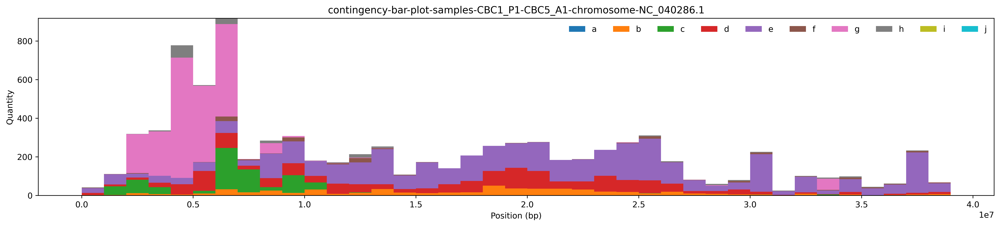

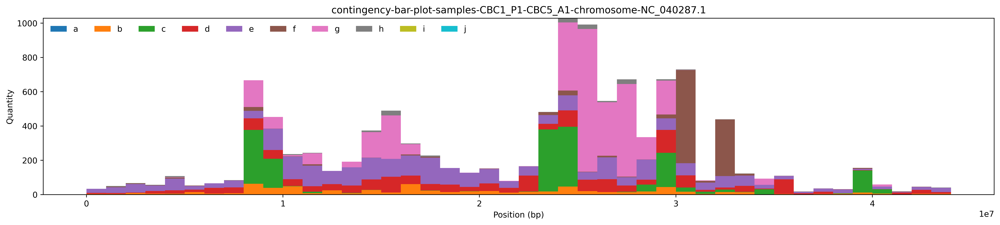

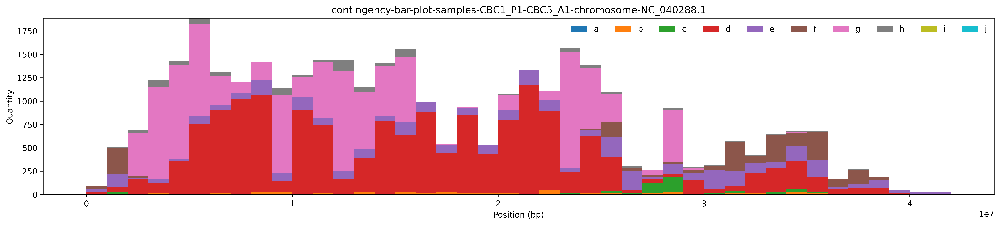

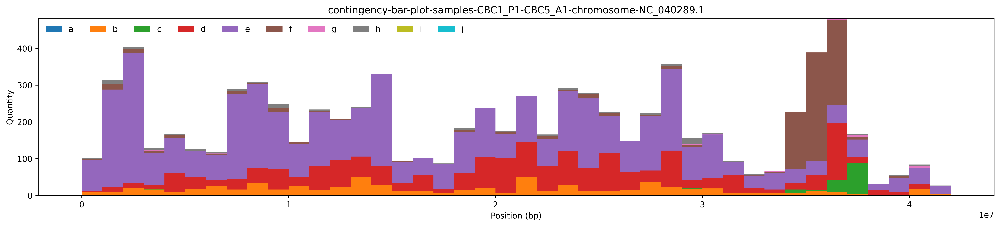

In [61]:
plt.close('all')
window_size = 1000000
CTbarPlots(samples, vcf_df_04, chrom_len_00, window_size)

## <span style="color:blue"> PART 7: Bar Plots per Chromosome</span>

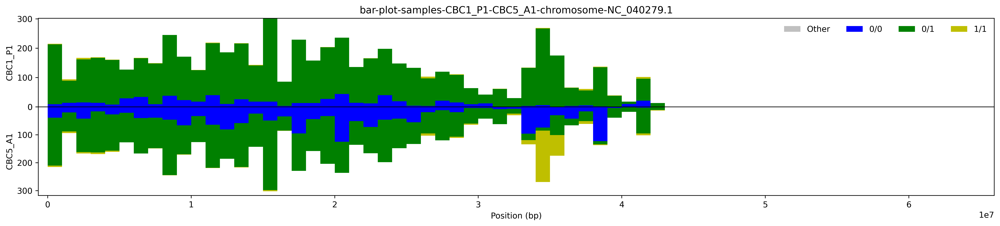

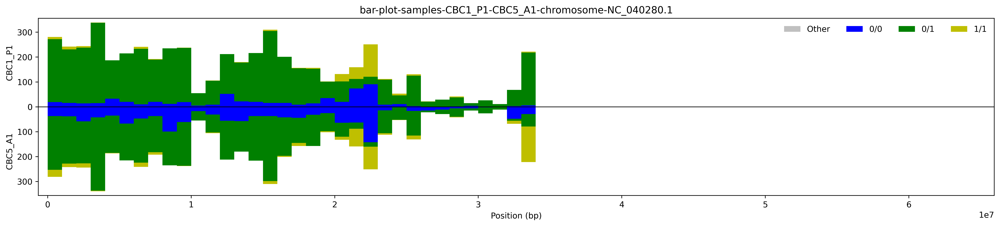

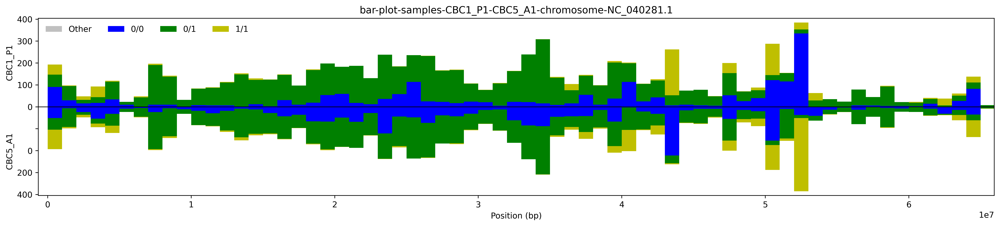

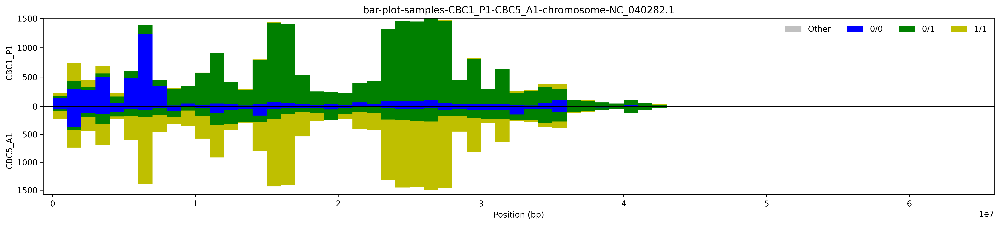

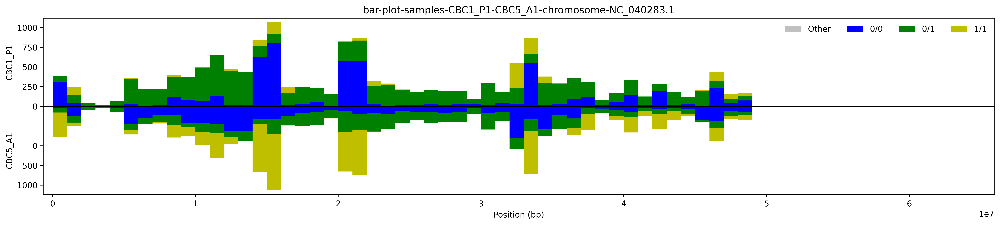

...

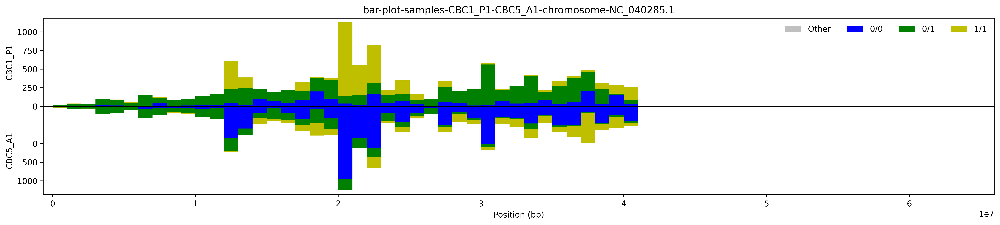

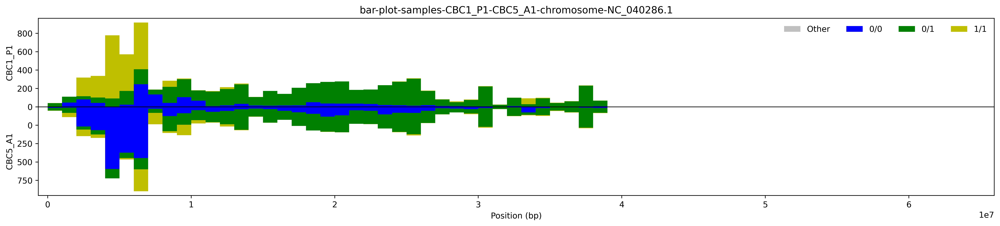

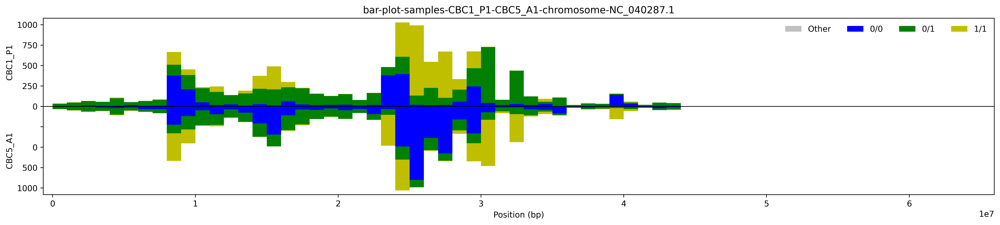

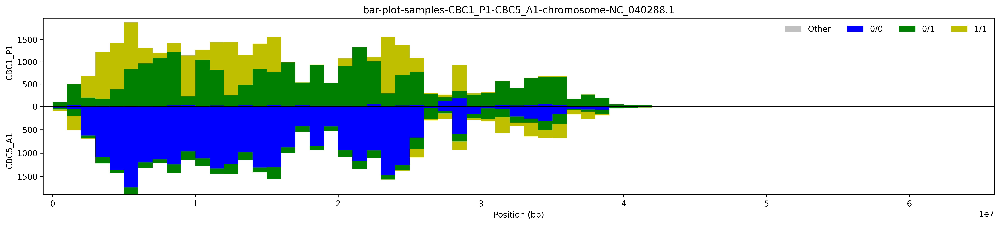

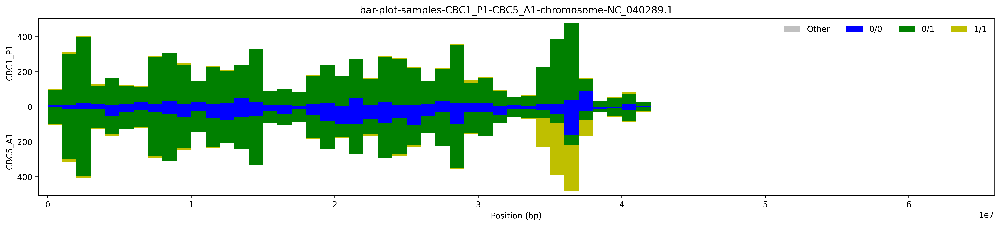

In [62]:
# suppress all the warnings from the inverted tickes of bar plots
import warnings
warnings.filterwarnings('ignore')

plt.close('all')
GTbarPlots(samples, vcf_df_04, chrom_len_00, window_size)

## <span style="color:blue"> PART 8: GT Plots per Chromosome</span>

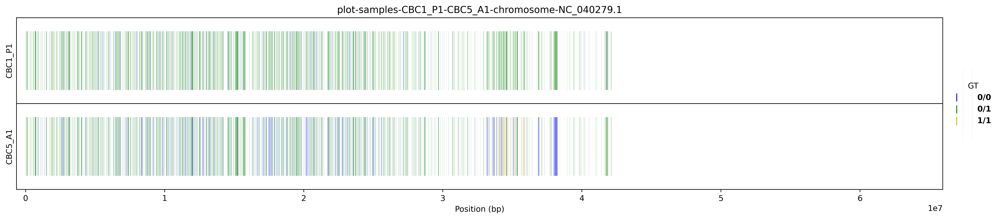

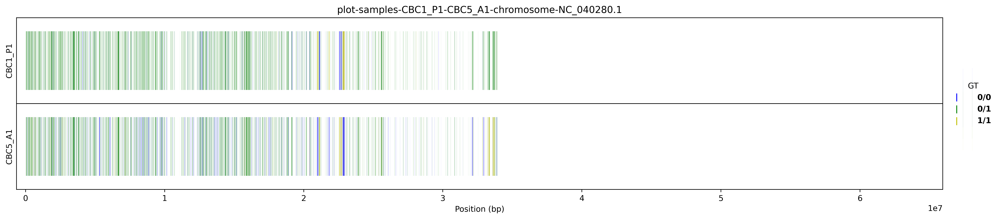

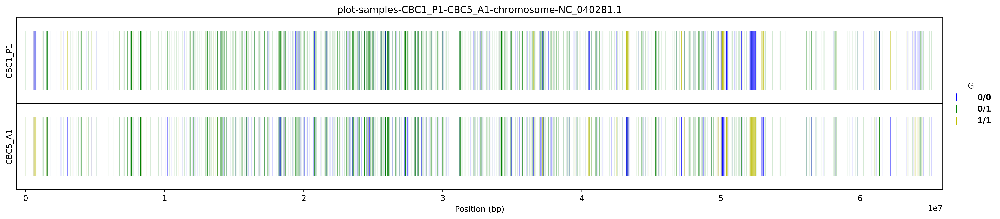

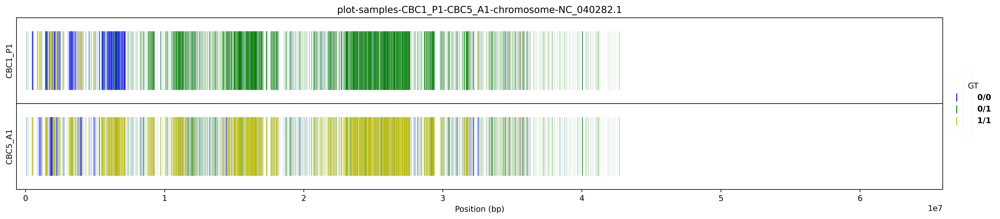

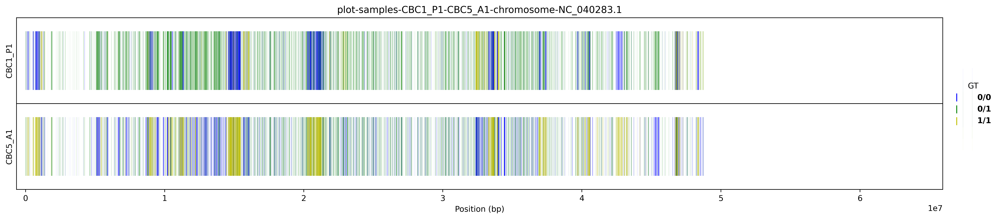

...

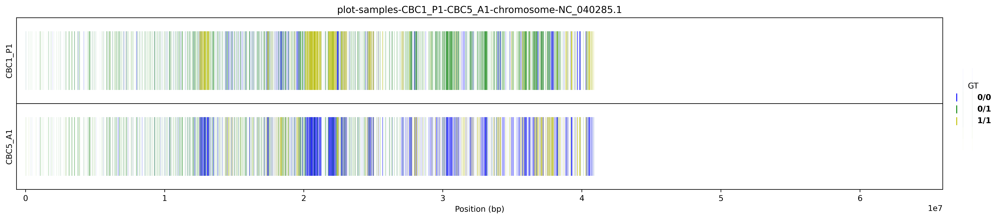

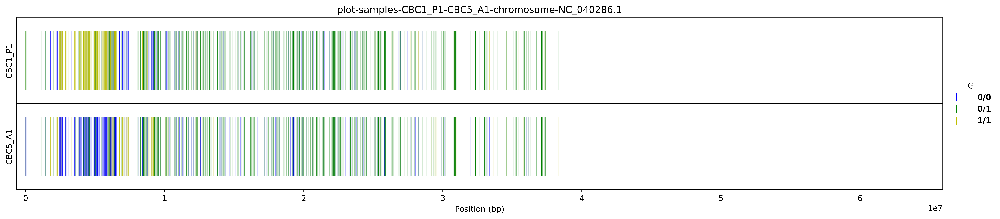

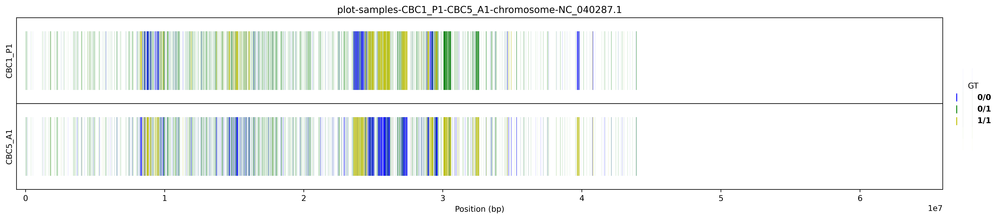

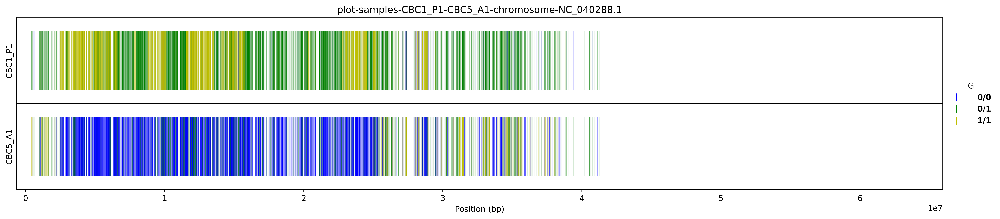

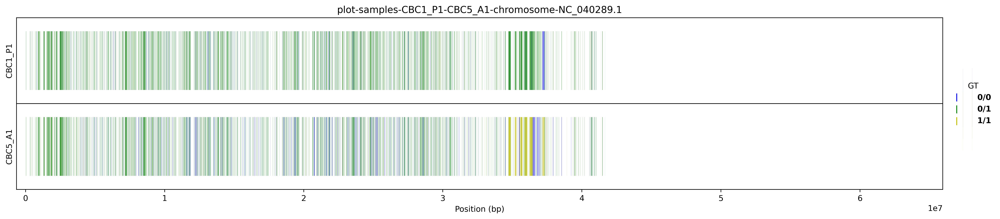

In [63]:
plt.close('all')
GTplots(samples, vcf_df_04, chrom_len_00)

## <span style="color:blue"> PART 9: Contingency Table per Chromosome</span>

In [64]:
import dataframe_image as dfi

for chromosome in chrom_len_00.index:
    chromosome_df = vcf_df_04[ vcf_df_04.CHROM == chromosome ]
    
    # reset chromosome_df indexes for contingency table
    chromosome_df.reset_index(inplace=True, drop=True)
    chromosome_ct = contingency_table(samples, chromosome_df, chromosome)


Contingency Table - Chromosome NC_040279.1

                 CBC5_A1_GT                 
                        0/0   0/1  1/1 other
CBC1_P1_GT 0/0            0   610   16     0
           0/1         1719  3363  338     0
           1/1            7    45    0     0
           other          0     0    0     0

Contingency Table - Chromosome NC_040280.1

                 CBC5_A1_GT                 
                        0/0   0/1  1/1 other
CBC1_P1_GT 0/0            0   418  183     0
           0/1         1104  3096  297     0
           1/1          214    71    0     0
           other          0     0    0     0

Contingency Table - Chromosome NC_040281.1

                 CBC5_A1_GT                 
                        0/0   0/1  1/1 other
CBC1_P1_GT 0/0            0  1056  972     0
           0/1         1660  3848  172     0
           1/1          678   104    0     0
           other          0     0    0     0

Contingency Table - Chromosome NC_040282.1

          